### Table of Contents

* [Chapter 1](#chapter1) Nettoyage des données


## Section 1.1 <a class="anchor" id="section_1_1"></a> Importation et analyse des données

In [1]:
# import des librairies
import numpy as np
import pandas as pd
import glob
import scipy.stats as stats
from sklearn import cluster, metrics

## Les figures sont réalisées avec Plotly
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from   plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.collections import LineCollection


In [2]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
path_data='/content/drive/MyDrive/OC Asma - Tahri/P05/Data/'

In [4]:
data = pd.read_csv(path_data+'data.csv',index_col=0)
data.head(2)

,customer_unique_id,r,f,m,total_price,product_category_name_english,customer_state,seller_id,review_score,payment_type
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,141.90,bed_bath_table,SP,da8622b14eb17ae2831f4ac5b9dab84a,5,credit_card
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,27.19,health_beauty,SP,138dbe45fc62f1e244378131a6801526,4,credit_card


#### RFM

Je vais commencer par étudier la segmentation sur la base du RFM que je vais garder comme baseline et essayer par la suite d'améliorer les résultats de la segmentation en rajoutant dautres variables.

In [5]:
rfm=data[['customer_unique_id','r','f','total_price']]
rfm=rfm.groupby('customer_unique_id', as_index=False).max()
rfm

,customer_unique_id,r,f,total_price
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19
2,0000f46a3911fa3c0805444483337064,584,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,370,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89
...,...,...,...,...
93336,fffcf5a5ff07b0908bd4e2dbc735a684,482,1,1148.28
93337,fffea47cd6d3cc0a88bd621562a9d061,301,1,84.58
93338,ffff371b4d645b6ecea244b27531430a,617,1,112.46
93339,ffff5962728ec6157033ef9805bacc48,168,1,133.69


In [6]:
rfm['r_score'] = pd.qcut(rfm['r'], 2, labels=[1, 2]).astype(str)
rfm['f_score'] = rfm['f'].apply(lambda x: '1' if x==1 else '2')
rfm['m_score'] = pd.qcut(rfm['total_price'], 2, labels=[1, 2]).astype(str)
rfm['rfm_score'] = rfm['r_score'] + rfm['f_score'] + rfm['m_score']
rfm

,customer_unique_id,r,f,total_price,r_score,f_score,m_score,rfm_score
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,1,1,2,112
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,1,1,1,111
2,0000f46a3911fa3c0805444483337064,584,1,86.22,2,1,1,211
3,0000f6ccb0745a6a4b88665a16c9f078,370,1,43.62,2,1,1,211
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89,2,1,2,212
...,...,...,...,...,...,...,...,...
93336,fffcf5a5ff07b0908bd4e2dbc735a684,482,1,1148.28,2,1,2,212
93337,fffea47cd6d3cc0a88bd621562a9d061,301,1,84.58,2,1,1,211
93338,ffff371b4d645b6ecea244b27531430a,617,1,112.46,2,1,2,212
93339,ffff5962728ec6157033ef9805bacc48,168,1,133.69,1,1,2,112


Définition des segments:
  

Définir les segments:

r_score: 1 ==> clients qui ont commandé récemment

r_score: 2 ==> clients qui n'ont pas commandé depuis un moment

f_score: 1 ==> clients qui ont commandé une seule fois

f_score: 2 ==> clients qui ont commandé plus qu'une fois

m_score: 1 ==> montant de la commande pas élevé

m_score: 2 ==> montant de la commande élevé



rfm_score: 122 ==> Cibles (clients récents qui commandent plus qu'une fois avec un montant important)


rfm_score: 211, 212 ==> Partis (clients qui ont commandé une seule fois depuis un moment)


rfm_score: 111, 112 ==> Nouveaux one  (clients récents une seule commande)

rfm_score: 121 ==> Nouveaux many  (clients récents plusieurs commandes)

rfm_score: 221, 222 ==> Anciens many (clients qui ont passé plus d'une commande mais depuis un moment)



In [7]:
def segment(x):
    if x == '122':
        return 'target'
    elif x in ['211', '212']:
        return 'Gone'
    elif x in ['111', '112']:
        return 'New_one'
    elif x in ['121']:
        return 'New_many'
   
    else:
        return 'Old_many'

In [8]:
rfm['segments'] = rfm['rfm_score'].apply(segment)
rfm['segments'].value_counts(normalize=True)*100

Gone        48.620649
New_one     48.379597
Old_many     1.344532
target       1.092767
New_many     0.562454
Name: segments, dtype: float64

In [9]:
fig= px.pie(rfm, names='segments', title='Répartition des segments')
fig.update_traces(rotation=90, pull=0.05)
fig.update_layout(width=960,height=480, legend=dict(xanchor="left", x=0.92))

Près de 50% de la clientelle fait parti du segment "Gone" des clients qui ont commandé une seule fois depuis un moment.

Prés de 50% de la clientelle fait parti du segment "New One" des nouveaux clients qui ont commandé une seule fois.

près de 3% desclients ont commandé plus qu'une fois.

In [10]:
segmentation = rfm.groupby('segments').agg(RecencyMean = ('r', 'mean'),
                                          FrequencyMean = ('f', 'mean'),
                                          MonetaryMean = ('total_price', 'mean'),
                                          GroupSize = ('r', 'size'))
segmentation

,RecencyMean,FrequencyMean,MonetaryMean,GroupSize
segments,,,,
Gone,410.605645,1.000000,146.121614,45383
New_many,161.992381,2.068571,65.271467,525
New_one,158.364786,1.000000,148.787848,45158
Old_many,398.218327,2.078884,168.921410,1255
target,157.393137,2.180392,219.736686,1020


In [11]:
!pip3 install squarify

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


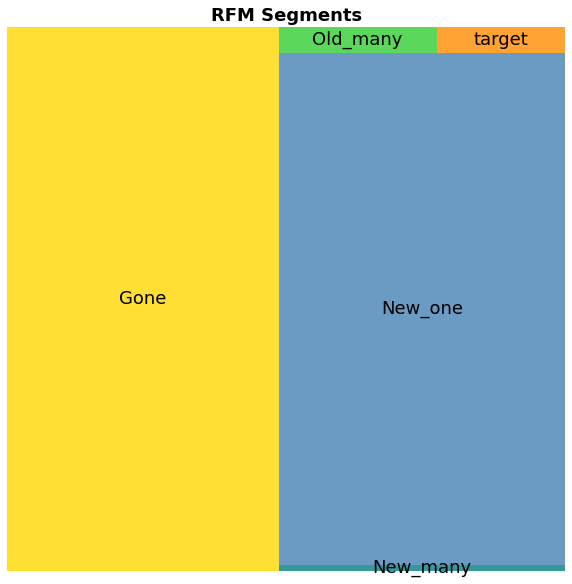

In [12]:
import squarify
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 18}

plt.rc('font', **font)


fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(10, 10)
squarify.plot(sizes = segmentation['GroupSize'], 
              label = segmentation.index,
              color = ['gold', 'teal', 'steelblue', 'limegreen', 'darkorange', 'coral'],
              alpha = 0.8)
plt.title("RFM Segments",fontsize=18,fontweight="bold")
plt.axis('off')
plt.show()

**Interpretation des segments**

Avec cette première segmentation, on remarque que:

le segment "Gone" qui correspond aux client qui ont commandé une seule fois depuis un moment, contient (48%) 45383  clients.

le deuxième segement "New_one" qui représente les clients qui ont commandé récement mais une seule fois, contient (48% également) 45158 cients.

les 3% restants des clients sont divisés sur les 3 segements :

-"Old_many": les clients qui ont commandé plus qu'une fois mais depuis un moment: contient 1255 clients

-"New_many": les clients qui ont commandé plus qu'une fois récement: contient 525 clients

-"target": les clients qui ont commandé plus qu'une fois récement avec un montant élevé, contient 1020 clients

### RFM + Satisfaction

Cette première segmentation n'est pas très conculante, nous devons chercher pourquoi les clients ne reviennent pas.

Nous allons rajouter la satisfactoin pour essayer de voir si ça explique le non retour des clients.

In [13]:
#Data RFM plus satisfaction:
rfm_satisfaction=data[['customer_unique_id','r','f','total_price','review_score']]
rfm_satisfaction=rfm_satisfaction.groupby('customer_unique_id', as_index=False).max()
rfm_satisfaction.head(2)

,customer_unique_id,r,f,total_price,review_score
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,5
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,4


In [14]:
#Création d'une variable binaire 0==> non satisfait, 1==>satisfait:
rfm_satisfaction['satisfaction'] = np.where(rfm_satisfaction['review_score']<4, 0, 1).astype(str)
rfm_satisfaction.head(2)

,customer_unique_id,r,f,total_price,review_score,satisfaction
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,5,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,4,1


In [15]:
#la distribution de note de satisfaction par prix payé:
fig = px.scatter(rfm_satisfaction, x="review_score", y="total_price")
fig.show()

On remarque que la distribution est pareil pour tous les prix.

In [16]:
#les notes de satisfaction par récence, avec la taille des points qui correspond au prix payé: 
import plotly.express as px
fig = px.scatter(rfm_satisfaction, x="review_score", y='r',
	         size="total_price")
fig.show()

la distribution est assez homogène pour tous les dates

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


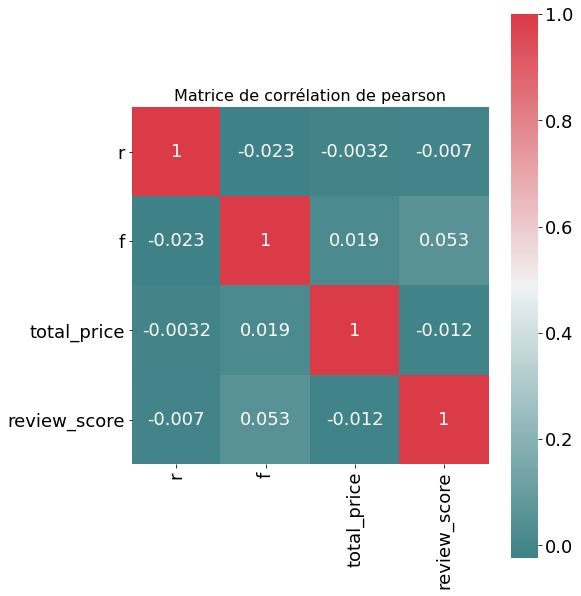

In [17]:
#Correlation entre le r, f, m et satisfaction:
import seaborn as sns
corrMatrix= rfm_satisfaction[['r','f','total_price','review_score']].corr(method='pearson')
fig, ax = plt.subplots(figsize=(8,10))  
sns.heatmap(corrMatrix, annot=True,cmap=sns.diverging_palette(200, 10, as_cmap=True),
            square=True)
plt.title('Matrice de corrélation de pearson', size=16)
plt.show()

Pas de correlation entre les variables

In [18]:
rfm_satisfaction_k=rfm_satisfaction[['customer_unique_id','r','f','total_price','satisfaction']]
rfm_satisfaction

,customer_unique_id,r,f,total_price,review_score,satisfaction
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,5,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,4,1
2,0000f46a3911fa3c0805444483337064,584,1,86.22,3,0
3,0000f6ccb0745a6a4b88665a16c9f078,370,1,43.62,4,1
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89,5,1
...,...,...,...,...,...,...
93336,fffcf5a5ff07b0908bd4e2dbc735a684,482,1,1148.28,5,1
93337,fffea47cd6d3cc0a88bd621562a9d061,301,1,84.58,4,1
93338,ffff371b4d645b6ecea244b27531430a,617,1,112.46,5,1
93339,ffff5962728ec6157033ef9805bacc48,168,1,133.69,5,1


In [19]:
fig = px.scatter(rfm_satisfaction_k, x="satisfaction", y='r',size="total_price")
fig.show()

In [20]:
#création de score pour les rfm+satisfaction:
rfm_satisfaction_k['r_score'] = pd.qcut(rfm_satisfaction_k['r'], 2, labels=[1, 2]).astype(str)
rfm_satisfaction_k['f_score'] = rfm_satisfaction_k['f'].apply(lambda x: '1' if x==1 else '2')
rfm_satisfaction_k['m_score'] = pd.qcut(rfm_satisfaction_k['total_price'], 2, labels=[1, 2]).astype(str)
rfm_satisfaction_k=rfm_satisfaction_k[['customer_unique_id','r','f','total_price','r_score','f_score','m_score','satisfaction']]
rfm_satisfaction_k['rfm_score'] = rfm_satisfaction_k['r_score']+rfm_satisfaction_k['f_score'] + rfm_satisfaction_k['m_score']+rfm_satisfaction_k['satisfaction']
rfm_satisfaction_k

,customer_unique_id,r,f,total_price,r_score,f_score,m_score,satisfaction,rfm_score
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,1,1,2,1,1121
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,1,1,1,1,1111
2,0000f46a3911fa3c0805444483337064,584,1,86.22,2,1,1,0,2110
3,0000f6ccb0745a6a4b88665a16c9f078,370,1,43.62,2,1,1,1,2111
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89,2,1,2,1,2121
...,...,...,...,...,...,...,...,...,...
93336,fffcf5a5ff07b0908bd4e2dbc735a684,482,1,1148.28,2,1,2,1,2121
93337,fffea47cd6d3cc0a88bd621562a9d061,301,1,84.58,2,1,1,1,2111
93338,ffff371b4d645b6ecea244b27531430a,617,1,112.46,2,1,2,1,2121
93339,ffff5962728ec6157033ef9805bacc48,168,1,133.69,1,1,2,1,1121


**Définition des segments**


rfm_score: 1221 ==> Target (clients récents qui commandent plus qu'une fois 



avec un montant important, satisfaits)

rfm_score: 1220 ==> Target (clients récents qui commandent plus qu'une fois avec un montant important, non satisfaits)


rfm_score: 2111, 2121 ==> Gone (clients qui ont commandé une seule fois depuis un moment, satisfaits)

rfm_score: 2110, 2120 ==> Gone (clients qui ont commandé une seule fois depuis un moment, non satisfaits)


rfm_score: 1111, 1121 ==> New one  (clients récents une seule commande satisfaits)


rfm_score: 1110, 1120 ==> New one  (clients récents une seule commande, non satisfaits)

rfm_score: 1211 ==> New many  (clients récents plusieurs commandes satisfaits)


rfm_score: 1210 ==> New many  (clients récents plusieurs commandes, non satisfaits)

rfm_score: 2211, 2221 ==> Old many (clients qui ont passé plus d'une commande mais depuis un moment satisfaits)


rfm_score: 2210, 2220 ==> Old many (clients qui ont passé plus d'une commande mais depuis un moment, non satisfaits)


In [21]:
def segment_satisfaction(x):
    if x == '1221':
        return 'Satisfied target'
    elif x == '1220':
      return 'Not satisfied target'
    elif x in ['2111', '2121','2211', '2221']:
        return 'Old satisfied'
    elif x in ['2110', '2120','2210','2220']:
        return 'Old not satisied'
    elif x in ['1111', '1121','1211']:
        return 'New satisfied one'
    elif x in ['1110', '1120','1210']:
        return 'New not satisfied one'

In [22]:
rfm_satisfaction_k['segments'] = rfm_satisfaction_k['rfm_score'].apply(segment_satisfaction)
rfm_satisfaction_k['segments'].value_counts(normalize=True)*100

Old satisfied            39.509969
New satisfied one        38.334708
New not satisfied one    10.607343
Old not satisied         10.455213
Satisfied target          0.989919
Not satisfied target      0.102849
Name: segments, dtype: float64

In [23]:
fig= px.pie(rfm_satisfaction_k, names='segments', title='Répartition des segments')
fig.update_traces(rotation=90, pull=0.05)
fig.update_layout(width=960,height=480, legend=dict(xanchor="left", x=0.92))

In [24]:
segmentation = rfm_satisfaction_k.groupby('segments').agg(RecencyMean = ('r', 'mean'),
                                          FrequencyMean = ('f', 'mean'),
                                          MonetaryMean = ('total_price', 'mean'),
                                          GroupSize = ('r', 'size'))
segmentation

,RecencyMean,FrequencyMean,MonetaryMean,GroupSize
segments,,,,
New not satisfied one,171.969195,1.004545,151.995968,9901
New satisfied one,154.653625,1.014421,146.674783,35782
Not satisfied target,189.614583,2.041667,200.999271,96
Old not satisied,404.757455,1.014243,147.099864,9759
Old satisfied,411.731663,1.032946,146.638629,36879
Satisfied target,154.045455,2.194805,221.683431,924


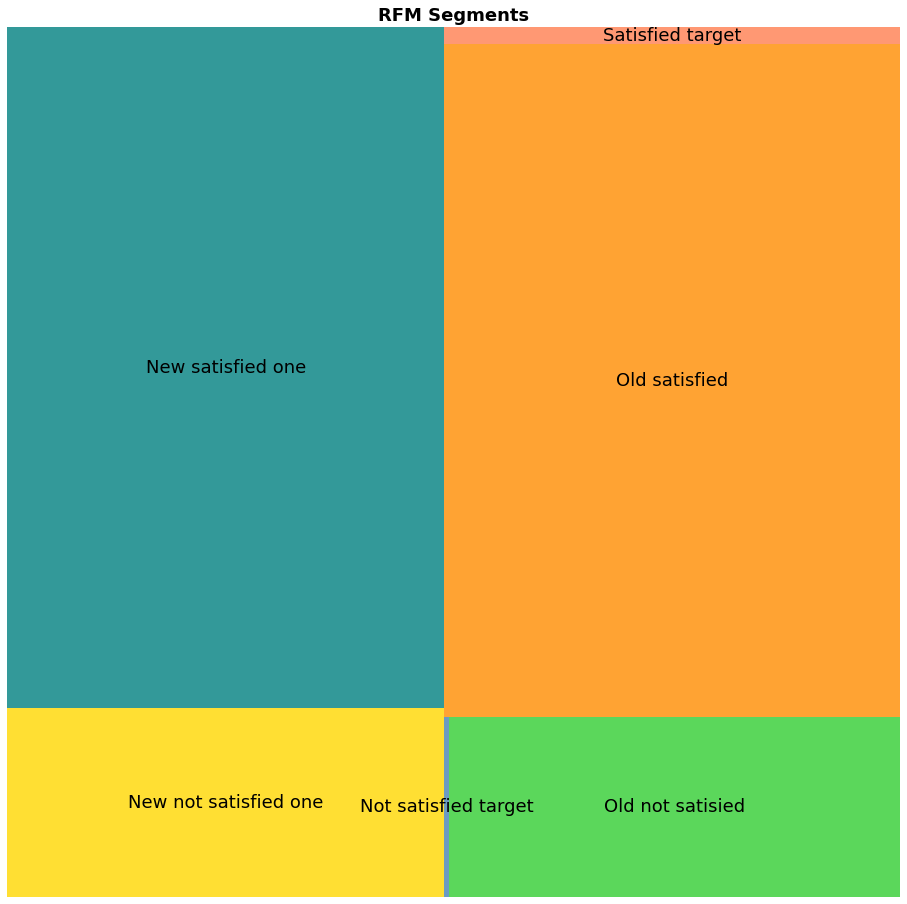

In [25]:
import squarify
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 18}

plt.rc('font', **font)


fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(16, 16)
squarify.plot(sizes = segmentation['GroupSize'], 
              label = segmentation.index,
              color = ['gold', 'teal', 'steelblue', 'limegreen', 'darkorange', 'coral'],
              alpha = 0.8)
plt.title("RFM Segments",fontsize=18,fontweight="bold")
plt.axis('off')
plt.show()

**Interprétation des segments**:

Avec cette nouvelle variable, on remarque l'apparition de 4 segments concéquents plus 4 segments avec moins de clients .

segment 1: "Old satisfied" qui contient les anciens clients qui étaient satisfaits de leur commande. ce segment représente 39% (36664 clients)

segment 2: "New satisfied one" qui contient les nouveaux clients qui ont commandé une seule fois et qui sont satisfaits, ce segment représente 38% (35297 clients)

segment 3: "New not satisfied one" qui contient les nouveaux clients qui ne sont pas satisfaits et qui ont commandé une seule fois, ce segment représente un peu moins de 11% (9974 clients)

segment 4: "Old not satisfied" qui représente les anciens clients non satisfaits, ce segment représente 10,5% (9759 clients) 

segment 5: "Satisfied target" c'est le segment des clients qui dépensent beaucoup, qui ont commandé plus qu'une fois et qui sont satisfaits. ce segment ne représente que 1% (924 clients)

segment 6: "Not satisfied target" est le plus petit segment, qui contient les clients récent qui dépensent beaucoup et qui reviennent mais qui ne sont pas satisfait. ce dernier segment même s'il ne contient que 96 client (0,1%) mais il est très important comme segment car il regroupe les clients cibles que le site peut potentiellement perdre s'il ne fait pas des actions ciblées pour comprendre leur insatisfactions.


 



#### Fonctions de visualisation des segments:

In [145]:
def get_clusters_name(df):
    """
    La fonction suivante à pour but de faciliter la lecture des dataframe, en associant une lettre à chaque cluster
    en fonction de ses caractéristiques principales. Il sera alors plus facile de comparer deux datasets entre eux
    avec cette indication. Elle permettra de plus d'affecter les mêmes couleurs aux mêmes clusters, et de pouvoir 
    suivre la trajectoire des centroids dans le plan défini par les variables souhaitées.
    
    ATTENTION, cette traduction n'est valable que pour ce nombre de clusters, avec ce scaling particulier.
    On utilise ici les caractéristiques principales que l'on a extrait de l'étude "sémantique" des différents clusters.
    On utilise aussi le nom des variables choisies au départ, cette fonction n'est donc pas réutilisable ailleurs.
    """
    #cluster with recent orders
    cluster_index = df[df['r']==df['r'].max()].index
    df.loc[cluster_index,'Cluster'] = 'E'
    
    #cluster with many oders
    cluster_index = df[df['f']==df['f'].max()].index
    df.loc[cluster_index,'Cluster'] = 'D'
    
    #cluster with max payment
    cluster_index = df[df['total_price']==df['total_price'].max()].index
    df.loc[cluster_index,'Cluster'] = 'C'
    
    #cluster with satisfesd clients
    cluster_index = df[df['satisfaction']==df['satisfaction'].max()].index
    df.loc[cluster_index,'Cluster'] = 'B'
    
    #cluster with not satisfesd clients
    cluster_index = df[df['satisfaction']==df['satisfaction'].min()].index
    df.loc[cluster_index,'Cluster'] = 'E'

    cluster_index = df.loc[df['Cluster'].isna()].index
    df.loc[cluster_index,'Cluster'] = 'A'
    
    df.sort_values('Cluster', inplace=True)

In [27]:
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None, easy_reading=True):
    """
    Cette fonction affiche les variables/features de notre jeu de données dans le plan des composantes
    principales trouvées par ACP.
    """
    # initialisation de la figure
    fig, ax = plt.subplots(1,len(axis_ranks),figsize=(15,7))
    for k, (d1, d2) in enumerate(axis_ranks): 
        if d2 < n_comp:
            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            # si easy_reading est à True, alors on n'affiche que les variables qui ont une norme > 0.1
            if easy_reading:
                pcs_visible = [[],[]]
                labels_visible = []
                for i, (x,y) in enumerate(zip(pcs[d1,:],pcs[d2,:])):
                    if x**2+y**2 > 0.2:
                        pcs_visible[0].append(x)
                        pcs_visible[1].append(y)
                        if labels is not None:
                            labels_visible.append(labels[i])
                pcs_visible = np.asarray(pcs_visible)

                ax[k].quiver(np.zeros(pcs_visible.shape[1]), np.zeros(pcs_visible.shape[1]),
                   pcs_visible[0,:], pcs_visible[1,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                
                # affichage des noms des variables
                if labels is not None:
                    for i,(x, y) in enumerate(pcs_visible[[0,1]].T):  
                        if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                            ax[k].text(x, y, labels_visible[i], fontsize='14', ha='center', va='center', 
                                       rotation=label_rotation, color="blue", alpha=0.5)
            else:
                if pcs.shape[1] < 30 :
                    ax[k].quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                       pcs[d1,:], pcs[d2,:], 
                       angles='xy', scale_units='xy', scale=1, color="grey")
                    # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
                else:
                    lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                    ax[k].add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
                # affichage des noms des variables
                if labels is not None:
                    for i,(x, y) in enumerate(pcs[[d1,d2]].T):  
                        if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                            ax[k].text(x, y, labels[i], fontsize='14', ha='center', va='center', 
                                       rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            ax[k].add_artist(circle)

            # définition des limites du graphique
            ax[k].set_xlim(xmin, xmax)
            ax[k].set_ylim(ymin, ymax)
            #plt.xlim(-1, 1)
            #plt.ylim(-1, 1)
        
            # affichage des lignes horizontales et verticales
            ax[k].plot([-1, 1], [0, 0], color='grey', ls='--')
            ax[k].plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            ax[k].set_xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            ax[k].set_ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            ax[k].set_title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
             
    plt.show(block=False)

In [28]:
def plot_clusters(cluster_labels, xaxis, yaxis, colormap, ax, xlabel=None, ylabel=None, title=None):
    """
    Scatter plot des individus dans le plan défini par xaxis et yaxis
    """
    ax.scatter(xaxis, yaxis, c=colormap[cluster_labels], alpha=0.2)
    if xlabel:
        ax.set_xlabel(xlabel)
    if ylabel:
        ax.set_ylabel(ylabel)
    if title:
        ax.set_title(legend[i+1])

In [29]:
def plot_segments(centroids, labels, colormap, ax, fill=False):
    """
    Affichage des clusters sur diagramme de type radar pour interprétation sémantique
    """
    try:
        dim = centroids.shape[1]
    except:
        dim = len(centroids)
    angles = [n / dim * 2 * np.pi for n in range(dim)]
    angles += angles[:1]
    
    #first axis on top
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    
    # Draw one axe per variable + add labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)
    
    # scaling pour visualisation sur diagramme radar
    scaled_centroids = scale(centroids, 0,1)
    for k, group in enumerate(scaled_centroids):
        group = group.tolist()
        group += group[:1]
        ax.plot(angles, group, linewidth=2, linestyle='solid', color=colormap[k], label='group %d'%k)
        if fill:
            ax.fill(angles, group, color=colormap[i], alpha=0.1)
            
        ax.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1)) 

In [30]:
def scale(X, x_min, x_max):
    """
    Retourne la variable d'entrée avec des valeurs comprises entre x_min et x_max.
    """
    nom = (X-X.min(axis=0))*(x_max-x_min)
    denom = X.max(axis=0) - X.min(axis=0)
    return x_min + nom/denom 

#### Choix de la méthode de normalisation des variables

Pour appliquer les algorithmes de segmentation, nous allons avant, procéder à la normalisation des variables. A fin d'avoir un rendu optimum, nous allons comparer les methodes de normalisation pour choisir la méthode la mieux adaptée.

les méthodes à comparer :

StandardScaler

MinMaxScaler

RobustScaler

In [31]:
from sklearn import preprocessing
X=rfm_satisfaction.drop(['customer_unique_id','review_score'], axis=1).values
X.shape

(93341, 4)

In [32]:
std_scaler = preprocessing.StandardScaler()
X_std = std_scaler.fit_transform(X)

minmax_scaler = preprocessing.MinMaxScaler()
X_minmax = minmax_scaler.fit_transform(X)

robust_scaler = preprocessing.RobustScaler()
X_rob = robust_scaler.fit_transform(X)

In [33]:
X_list= [X_std, X_minmax, X_rob]

In [34]:
rfm_satisfaction

,customer_unique_id,r,f,total_price,review_score,satisfaction
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,5,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,4,1
2,0000f46a3911fa3c0805444483337064,584,1,86.22,3,0
3,0000f6ccb0745a6a4b88665a16c9f078,370,1,43.62,4,1
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89,5,1
...,...,...,...,...,...,...
93336,fffcf5a5ff07b0908bd4e2dbc735a684,482,1,1148.28,5,1
93337,fffea47cd6d3cc0a88bd621562a9d061,301,1,84.58,4,1
93338,ffff371b4d645b6ecea244b27531430a,617,1,112.46,5,1
93339,ffff5962728ec6157033ef9805bacc48,168,1,133.69,5,1


In [35]:
k_col=['r','f','total_price','satisfaction']

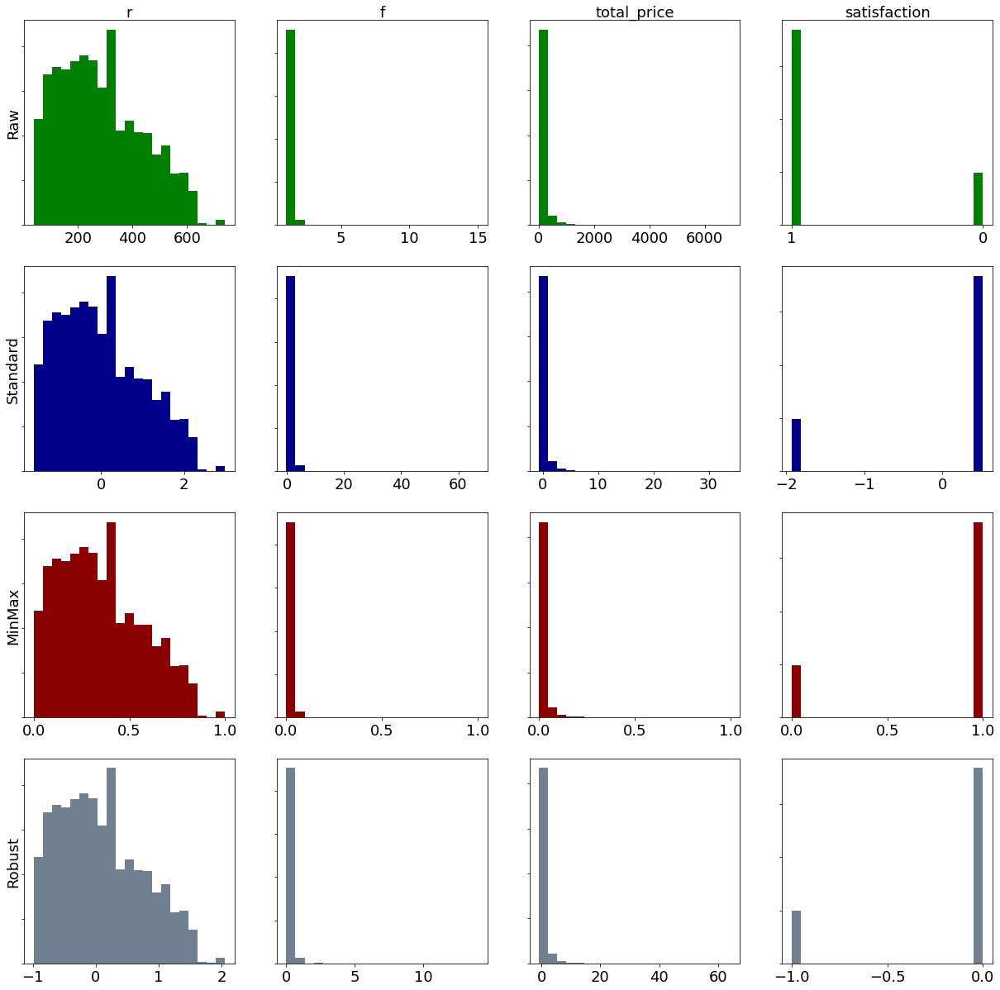

In [36]:
fig, ax = plt.subplots(len(X_list)+1,X.shape[1],figsize=(21,21))
colors = ['green','darkblue','darkred', 'slategrey']
legend = ['Raw','Standard','MinMax','Robust']
for i, X_scaled in enumerate([X]+X_list):
    for j, feat in enumerate(k_col):
        ax[i,j].hist(X_scaled[:,j],bins=21,color=colors[i])
        ax[i,j].tick_params(labelleft=False)
        
        if i==0:
            ax[i,j].set_xlabel(feat) 
            ax[i,j].xaxis.set_label_position('top')
        
        if j==0:
            ax[i,j].set_ylabel(legend[i])


Les 3 méthodes ne changent rien à la distribution initiale de mes 4 variables, par la suite je vais utiliser la normalisation standars

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


Standard


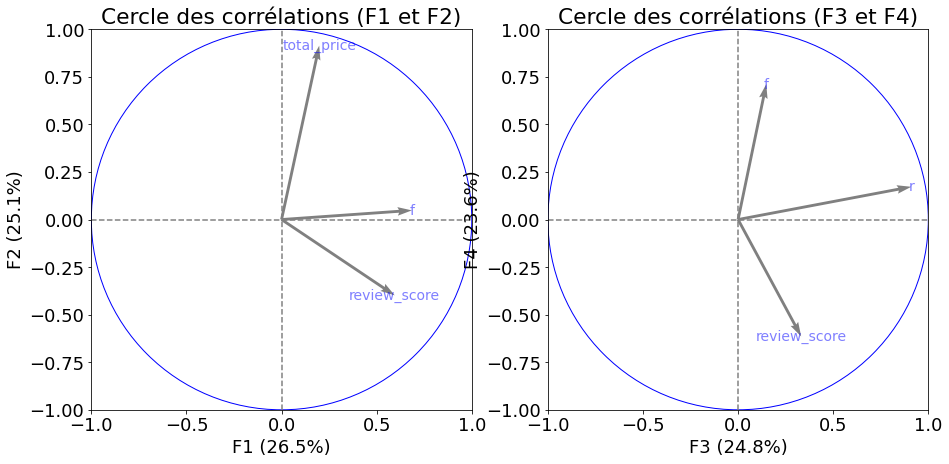

----------------------------------------------------------------------------------------------------------------
MinMax


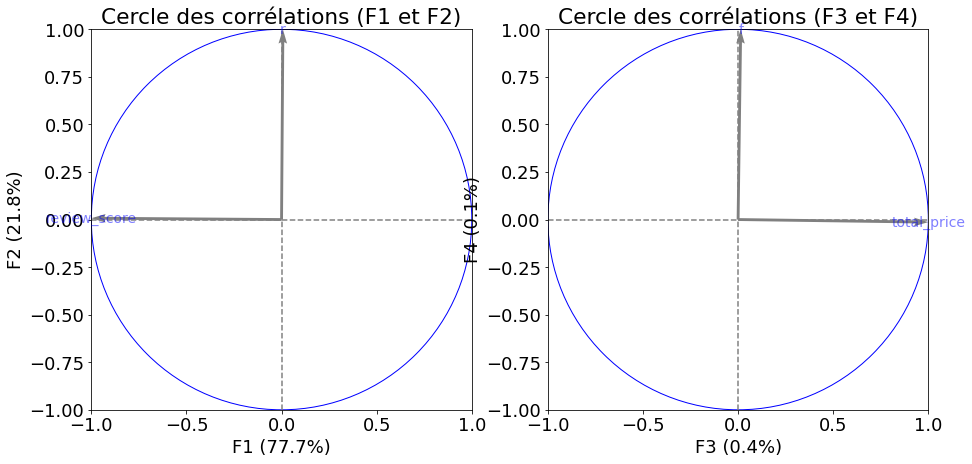

----------------------------------------------------------------------------------------------------------------
Robust


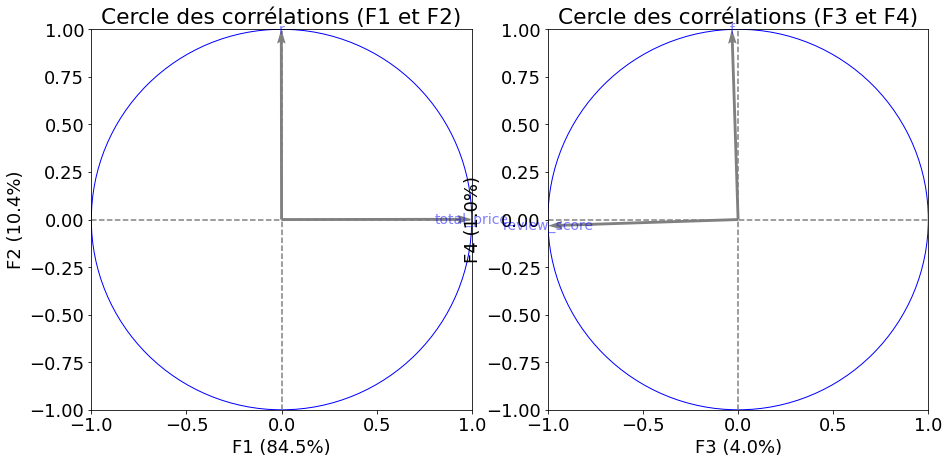

----------------------------------------------------------------------------------------------------------------


In [37]:
from sklearn import decomposition
for i, X_scaled in enumerate(X_list):
    pca = decomposition.PCA(n_components = 4)
    pca.fit(X_scaled)
    X_trans = pca.transform(X_scaled)
    print(legend[i+1])
    display_circles(pca.components_, 4, pca, [(0,1),(2,3)], labels = rfm_satisfaction.columns[1:].tolist(), easy_reading=True)
    print("----------------------------------------------------------------------------------------------------------------")

La représentation des 4 variables sur les cercles de corrélations confirme le choix de la normalisation standard des variables, les autres methodes de scaling donnent beaucoup d'importance à 2 variables seulement

In [38]:
%%time
min_clusters=2
max_clusters=9

s_score = []
inertia = []

for i, X_scaled in enumerate(X_list):
    print(f'Fitting {legend[i+1]} scaling')
    silhouettes = []
    sse = []
    for num_clusters in range(min_clusters, max_clusters+1):
        kmeans = cluster.KMeans(n_clusters=num_clusters, n_init=5, init='k-means++')
        kmeans.fit(X_scaled)

        silh = metrics.silhouette_score(X_scaled, kmeans.labels_)
        silhouettes.append(silh)
        sse.append(kmeans.inertia_)
    s_score.append(silhouettes)
    inertia.append(sse)

Fitting Standard scaling
Fitting MinMax scaling
Fitting Robust scaling
CPU times: user 1h 4min 2s, sys: 3min 10s, total: 1h 7min 12s
Wall time: 57min 56s


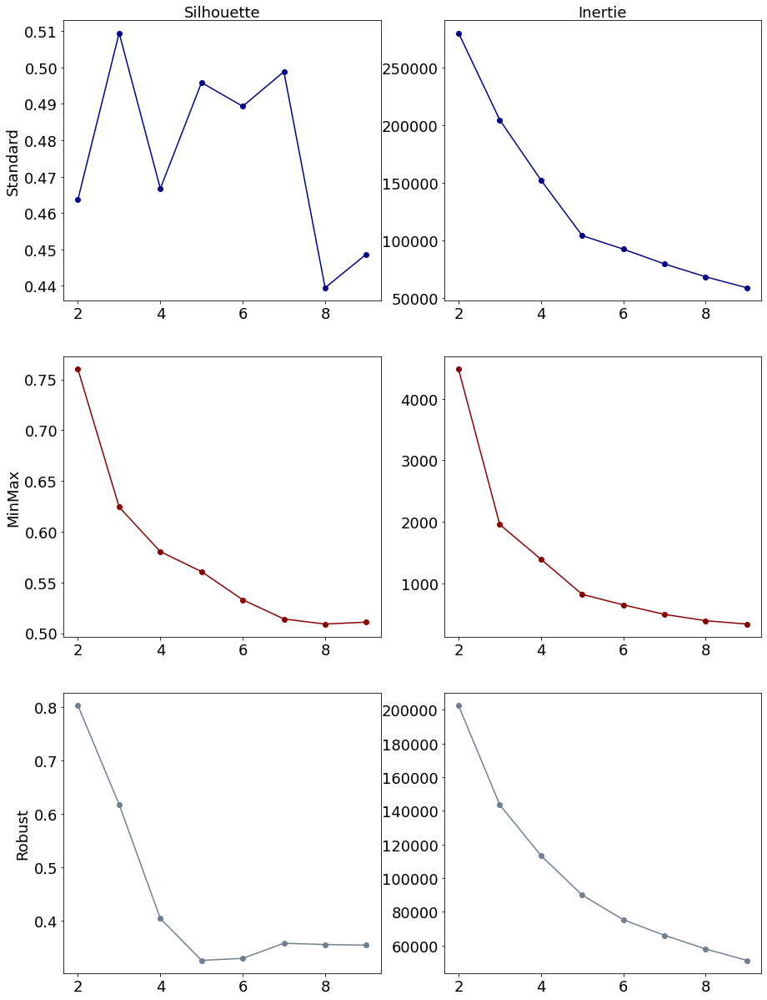

In [39]:
fig, ax = plt.subplots(len(X_list),2,figsize=(15,21))

for i, (silh, sse) in enumerate(zip(s_score, inertia)):
    ax[i,0].plot(range(min_clusters, max_clusters+1), silh, marker='o', color=colors[i+1])
    ax[i,0].set_ylabel(legend[i+1])
    ax[i,1].plot(range(min_clusters, max_clusters+1), sse, marker='o', color=colors[i+1])
    if i==0:
        ax[i,0].set_xlabel('Silhouette') 
        ax[i,0].xaxis.set_label_position('top')
        
        ax[i,1].set_xlabel('Inertie') 
        ax[i,1].xaxis.set_label_position('top')  

In [118]:
colormap = np.array(['blue','darkorange','green','darkred','gray','purple','orange','pink','red','black','yellow','darkgreen','beige'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future ver

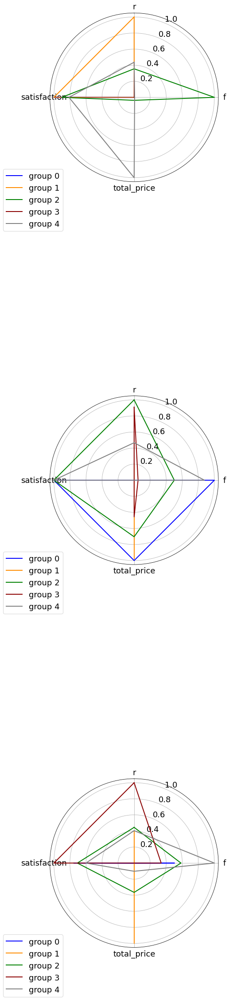

In [41]:
fig = plt.figure(figsize=(15,45))

n_cluster = 5

clustering_labels = []
clustering_centers = []

for i, X_scaled in enumerate(X_list):
    pca = decomposition.PCA(n_components = 2)
    pca.fit(X_scaled)
    X_trans = pca.transform(X_scaled)
    
    kmeans = cluster.KMeans(n_clusters=n_cluster, n_init=10, init='k-means++')
    kmeans.fit(X_scaled)
    clustering_labels.append(kmeans.labels_)
    clustering_centers.append(kmeans.cluster_centers_)
    
    # ####Clusters dans le premier plan principal
    ax1 = fig.add_subplot(len(X_list),2,2*i+1)
    plot_clusters(clustering_labels[i], np.array(X_trans[:,0]), np.array(X_trans[:,1]), colormap, ax1, 
                  xlabel='F1 ({}%)'.format(round(100*pca.explained_variance_ratio_[0],1)), 
                  ylabel='F2 ({}%)'.format(round(100*pca.explained_variance_ratio_[1],1)), 
                  title=legend[i+1]
                 )
   
    

    ####Radar plot pour interprétation des clusters
    ax2 = fig.add_subplot(len(X_list),2,2*i+1, polar=True)
    plot_segments(clustering_centers[i], k_col, colormap, ax2)



##### K-means

je vais appliquer le k-means en considérant la satisfaction binaire satisfait=1, non satisfait=0.

Je vais utiliser la normalisation standard pour les variables.

In [155]:
rfm_satisfaction=rfm_satisfaction[['customer_unique_id','r','f','total_price','satisfaction']]
rfm_satisfaction

,customer_unique_id,r,f,total_price,satisfaction
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,1
2,0000f46a3911fa3c0805444483337064,584,1,86.22,0
3,0000f6ccb0745a6a4b88665a16c9f078,370,1,43.62,1
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89,1
...,...,...,...,...,...
93336,fffcf5a5ff07b0908bd4e2dbc735a684,482,1,1148.28,1
93337,fffea47cd6d3cc0a88bd621562a9d061,301,1,84.58,1
93338,ffff371b4d645b6ecea244b27531430a,617,1,112.46,1
93339,ffff5962728ec6157033ef9805bacc48,168,1,133.69,1


In [156]:
#Utilisation de la méthode de normalisation standard:
X=rfm_satisfaction.drop('customer_unique_id', axis=1).values
X_norm=preprocessing.scale(X)
X_norm.shape

(93341, 4)

In [44]:
from sklearn import cluster, metrics


In [157]:
%%time
silhouettes=[]
inertie=[]
for num_clusters in range(2,10):
  cls=cluster.KMeans(n_clusters=num_clusters, n_init=1, init='k-means++')
  cls.fit(X_norm)
  silh=metrics.silhouette_score(X_norm,cls.labels_)
  iner=cls.inertia_
  silhouettes.append(silh)
  inertie.append(iner)


CPU times: user 22min 14s, sys: 1min 3s, total: 23min 17s
Wall time: 19min 53s


In [46]:
!pip3 install kneed

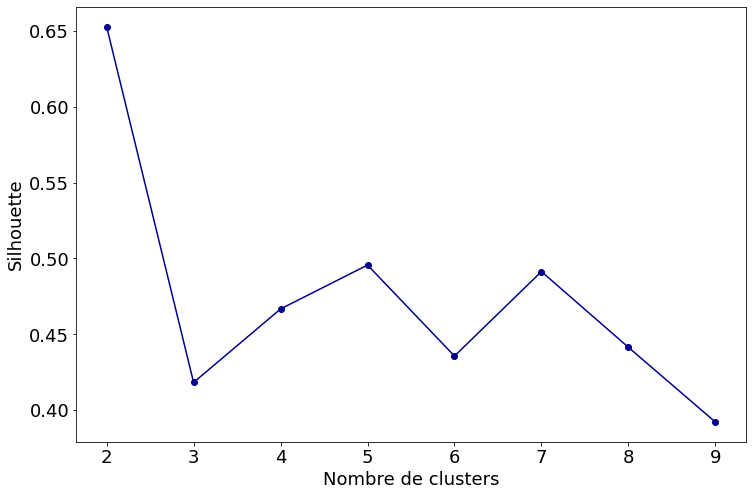

In [74]:
fig, ax = plt.subplots(figsize=(12, 8))
scaling_choice=0
ax.plot(range(2,10), 
        silhouettes, 
        marker='o', 
        color=colors[scaling_choice+1])
ax.set_xlabel('Nombre de clusters')
ax.set_ylabel('Silhouette')
plt.show()

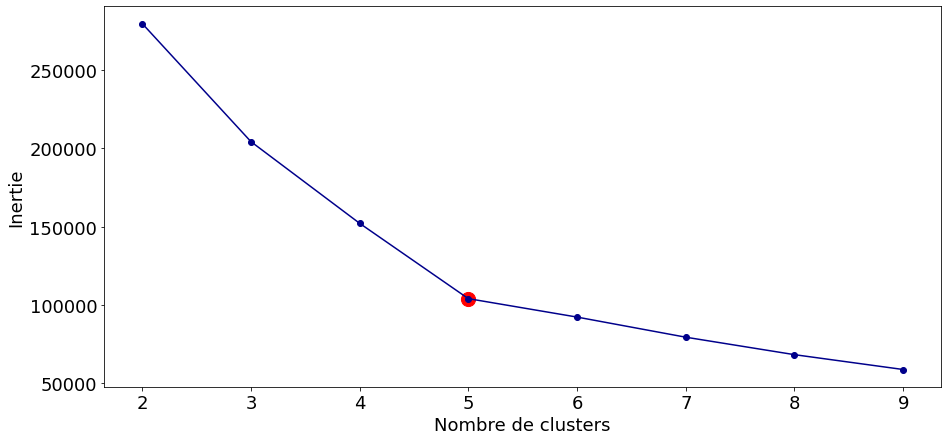

In [75]:
from kneed import KneeLocator

fig, ax = plt.subplots(figsize=(15, 7))
scaling_choice=0
xaxis = range(min_clusters, max_clusters+1)
kneedle = KneeLocator(xaxis, 
                      inertie, 
                      S=1.0, 
                      curve="convex", 
                      direction="decreasing"
                     ) #to determine point of highest curvature

ax.plot(xaxis, 
        inertia[scaling_choice], 
        marker='o', 
        color=colors[scaling_choice+1])

ax.scatter(kneedle.knee,
           inertia[scaling_choice][xaxis.index(kneedle.knee)],
           marker='o',s=200,color='red')

ax.set_xlabel('Nombre de clusters')
ax.set_ylabel('Inertie')

plt.show()

In [78]:
kmeans = cluster.KMeans(n_clusters=5, n_init=20, init='k-means++')
kmeans.fit(X_norm)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=20, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

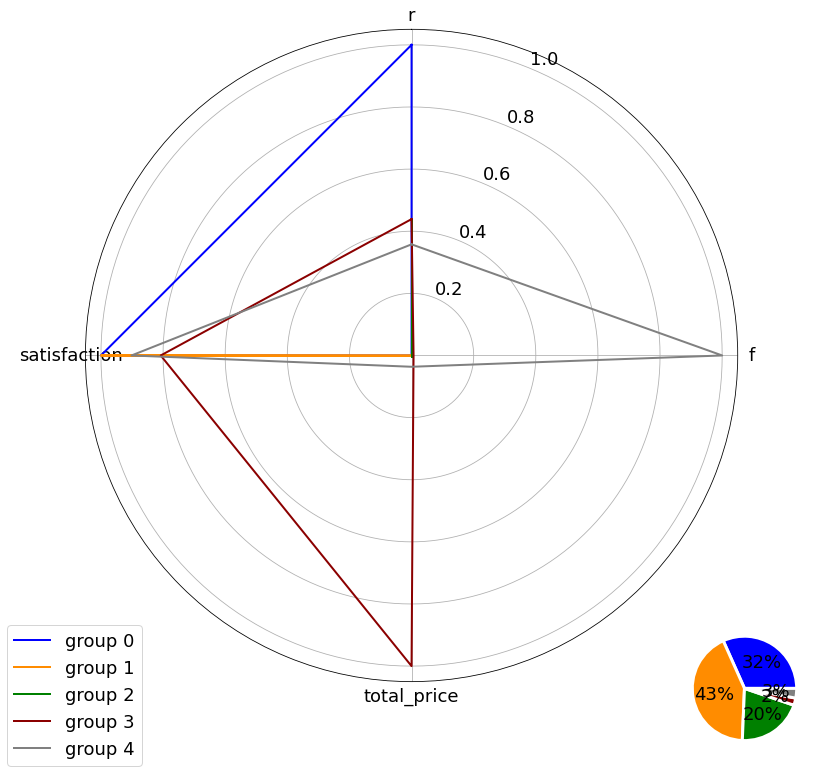

In [79]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, polar=True)
ax_inset = inset_axes(ax, width='20%', height='20%', loc=4,
                     borderpad=-4) #3: lower left corner

plot_segments(kmeans.cluster_centers_, rfm_satisfaction.columns[1:].tolist(), colormap, ax)

#Add pie inset with clusters distribution
count_array = np.bincount(kmeans.labels_)
ax_inset.pie(count_array, labeldistance=1.15, autopct='%1.0f%%', colors=colormap,
       wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' })

plt.show()

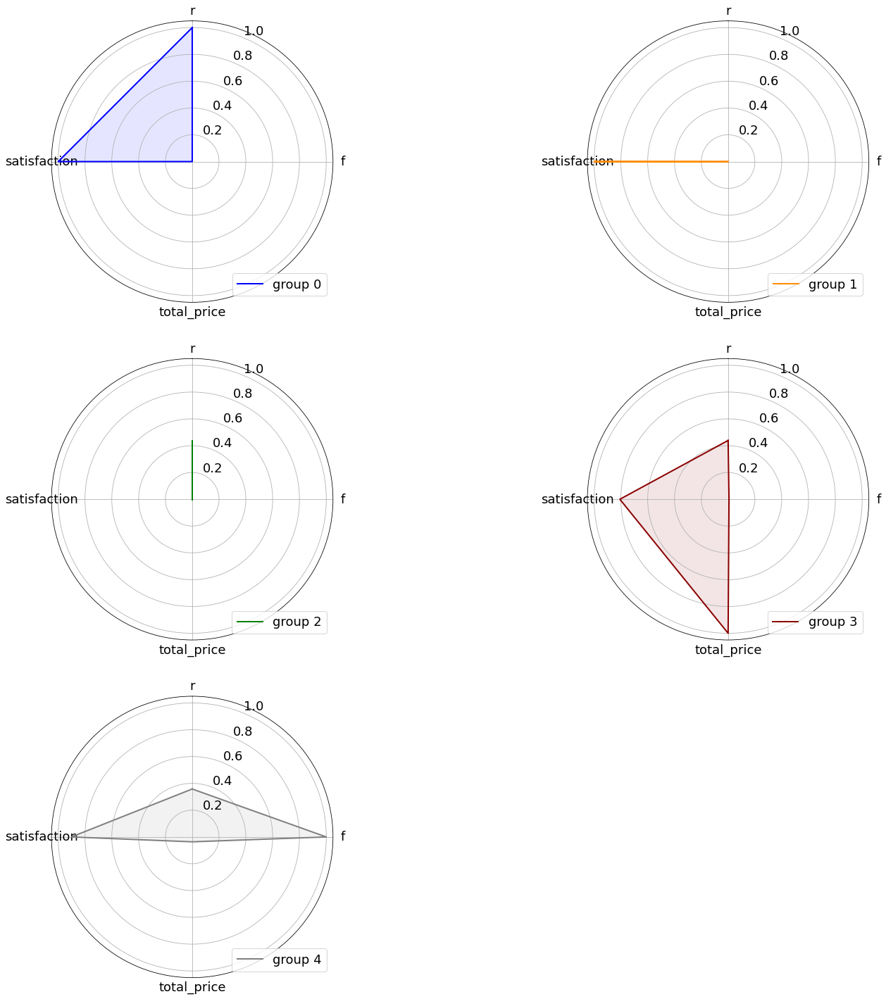

In [84]:
fig = plt.figure(figsize=(25,25))
dim = kmeans.cluster_centers_.shape[1]
angles = [n / dim * 2 * np.pi for n in range(dim)]
angles += angles[:1]
scaled_centroids = scale(kmeans.cluster_centers_, 0,1)
for i, group in enumerate(scaled_centroids):
    ax = fig.add_subplot(3, 2, i+1, polar=True)
    ax.set_ylim((0,1.05))
    #first axis on top
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(rfm_satisfaction.columns[1:].tolist())
    
    group = group.tolist()
    group += group[:1]
    ax.plot(angles, group, linewidth=2, linestyle='solid', color=colormap[i], label='group %d'%i)
    ax.fill(angles, group, color=colormap[i], alpha=0.1)
    
    ax.legend(loc='lower right')

plt.show()

In [85]:
from sklearn import decomposition
pca=decomposition.PCA(n_components=3)
pca.fit(X_norm)

print(pca.explained_variance_ratio_.cumsum())
X_trans=pca.transform(X_norm)

[0.26469802 0.51549874 0.76353471]


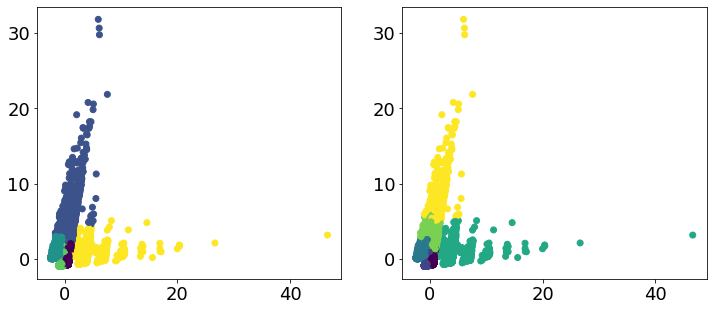

In [86]:
fig=plt.figure(figsize=(12,5))

cls=cluster.KMeans(n_clusters=5)
cls.fit(X_norm)
ax=fig.add_subplot(121)
ax.scatter(X_trans[:,0],X_trans[:,1],c=cls.labels_)

cls4=cluster.KMeans(n_clusters=6)
cls4.fit(X_norm)
ax=fig.add_subplot(122)
ax.scatter(X_trans[:,0],X_trans[:,1],c=cls4.labels_)

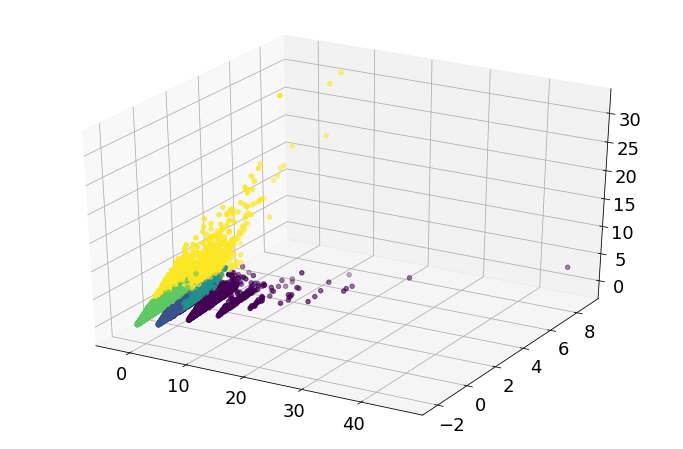

In [89]:
from mpl_toolkits import mplot3d
fig=plt.figure(figsize=(12,8))
cls=cluster.KMeans(n_clusters=5)
cls.fit(X_norm)
ax = plt.axes(projection='3d')
ax.scatter(X_trans[:,0],X_trans[:,2],X_trans[:,1],c=cls.labels_)

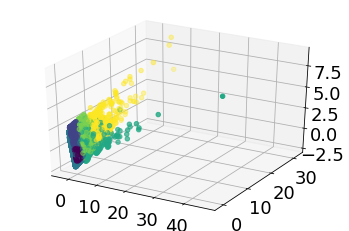

In [90]:
cls4=cluster.KMeans(n_clusters=6)
cls4.fit(X_norm)
ax = plt.axes(projection='3d')
ax.scatter(X_trans[:,0],X_trans[:,1],X_trans[:,2],c=cls4.labels_)

##### TSNE

In [158]:
%%time
tsne = manifold.TSNE(n_components=2, init='pca')
X_tsne = tsne.fit_transform(X_norm)

CPU times: user 47min 49s, sys: 3.93 s, total: 47min 53s
Wall time: 24min 33s


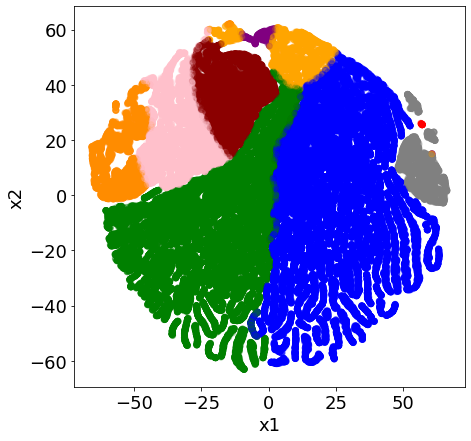

In [160]:
fig, ax = plt.subplots(figsize=(7, 7))

ax.scatter(X_tsne[:,0], X_tsne[:,1], c=colormap[cls.labels_], alpha=0.2)
ax.set_xlabel('x1')
ax.set_ylabel('x2')

plt.show()

##### K-Prototypes

pour les mêmes données, je vais appliquer maintenant le k-prototypes en gardant ma variable catégorielle "satisfaction":

In [53]:
df_kp=data[['customer_unique_id','r','f','total_price','review_score']]
df_kp=df_kp.groupby('customer_unique_id', as_index=False).max()
df_kp

,customer_unique_id,r,f,total_price,review_score
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,5
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,4
2,0000f46a3911fa3c0805444483337064,584,1,86.22,3
3,0000f6ccb0745a6a4b88665a16c9f078,370,1,43.62,4
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89,5
...,...,...,...,...,...
93336,fffcf5a5ff07b0908bd4e2dbc735a684,482,1,1148.28,5
93337,fffea47cd6d3cc0a88bd621562a9d061,301,1,84.58,4
93338,ffff371b4d645b6ecea244b27531430a,617,1,112.46,5
93339,ffff5962728ec6157033ef9805bacc48,168,1,133.69,5


In [54]:
df_k=df_kp[['r','f','total_price','review_score']]

In [55]:
!pip3 install kmodes

In [56]:
from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes

In [57]:
from sklearn.preprocessing import PowerTransformer
kprot_data = df_k.copy()
#Pre-processing
for c in df_k.select_dtypes(exclude='object').columns:
    pt = PowerTransformer()
    df_k[c] =  pt.fit_transform(np.array(kprot_data[c]).reshape(-1, 1))

categorical_columns = ['review_score'] 
kp = KPrototypes(n_clusters=10, init='Huang', n_init=1, verbose=True)
kp.fit_predict(kprot_data, categorical=list(range(3, 4)))

print(kp.cluster_centroids_)
print(kp.labels_)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 24764, ncost: 1207813601.0541375
Run: 1, iteration: 2/100, moves: 12793, ncost: 1011082966.7545589
Run: 1, iteration: 3/100, moves: 8715, ncost: 898419358.0233614
Run: 1, iteration: 4/100, moves: 8575, ncost: 848932271.5096934
Run: 1, iteration: 5/100, moves: 5969, ncost: 829351113.5203395
Run: 1, iteration: 6/100, moves: 4781, ncost: 813905684.494995
Run: 1, iteration: 7

In [58]:
# from sklearn.preprocessing import PowerTransformer
# from tqdm import tqdm

# kprot_data = df_k.copy()
# #Pre-processing
# for c in df_k.select_dtypes(exclude='object').columns:
#     pt = PowerTransformer()
#     kprot_data[c] =  pt.fit_transform(np.array(kprot_data[c]).reshape(-1, 1))

# categorical_columns = ['review_score'] #make sure to specify correct indices

# #Actual clustering
# kproto = KPrototypes(n_clusters= 10, init='Huang', n_jobs = 1)
# clusters = kproto.fit_predict(kprot_data, categorical=list(range(3, 4)))

# #Prints the count of each cluster group
# pd.Series(clusters).value_counts()

# #OPTIONAL: Elbow plot with cost (will take a LONG time)
# costs = []
# n_clusters = []
# clusters_assigned = []

# for i in tqdm(range(2, 15)):
#     try:
#         kproto = KPrototypes(n_clusters= i, init='Huang', verbose=2)
#         clusters = kproto.fit_predict(kprot_data, categorical=[0, 6, 7, 9, 13])
#         costs.append(kproto.cost_)
#         n_clusters.append(i)
#         clusters_assigned.append(clusters)
#     except:
#         print(f"Can't cluster with {i} clusters")
        
# fig = go.Figure(data=go.Scatter(x=n_clusters, y=costs ))
# fig.show()

L'utilisation de K-prototype n'a rien donné, et son exécution prend beaucoup de temps.

### RFM, Satisfaction, categorie de produit et type de paiement

In [91]:
df_category=data[['customer_unique_id','r','f','total_price','review_score','product_category_name_english','payment_type']]
df_category['satisfaction'] = np.where(df_category['review_score']<4, 0, 1).astype(str)
df_category

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,customer_unique_id,r,f,total_price,review_score,product_category_name_english,payment_type,satisfaction
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,5,bed_bath_table,credit_card,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,4,health_beauty,credit_card,1
2,0000f46a3911fa3c0805444483337064,584,1,86.22,3,stationery,credit_card,0
3,0000f6ccb0745a6a4b88665a16c9f078,370,1,43.62,4,telephony,credit_card,1
4,0004aac84e0df4da2b147fca70cf8255,336,1,196.89,5,telephony,credit_card,1
...,...,...,...,...,...,...,...,...
115706,fffcf5a5ff07b0908bd4e2dbc735a684,482,1,1148.28,5,health_beauty,credit_card,1
115707,fffea47cd6d3cc0a88bd621562a9d061,301,1,84.58,4,baby,credit_card,1
115708,ffff371b4d645b6ecea244b27531430a,617,1,112.46,5,auto,credit_card,1
115709,ffff5962728ec6157033ef9805bacc48,168,1,133.69,5,watches_gifts,credit_card,1


In [92]:
dummies = pd.get_dummies(df_category[['total_price','product_category_name_english','payment_type']], prefix = 'category')
df = pd.concat([df_category.customer_unique_id, dummies], axis=1)
df

,customer_unique_id,total_price,category_agro_industry_and_commerce,category_air_conditioning,category_art,category_arts_and_craftmanship,category_audio,category_auto,category_baby,category_bed_bath_table,category_books_general_interest,category_books_imported,category_books_technical,category_cds_dvds_musicals,category_christmas_supplies,category_cine_photo,category_computers,category_computers_accessories,category_consoles_games,category_construction_tools_construction,category_construction_tools_lights,category_construction_tools_safety,category_cool_stuff,category_costruction_tools_garden,category_costruction_tools_tools,category_diapers_and_hygiene,category_drinks,category_dvds_blu_ray,category_electronics,category_fashio_female_clothing,category_fashion_bags_accessories,category_fashion_childrens_clothes,category_fashion_male_clothing,category_fashion_shoes,category_fashion_sport,category_fashion_underwear_beach,category_fixed_telephony,category_flowers,category_food,category_food_drink,category_furniture_bedroom,category_furniture_decor,category_furniture_living_room,category_furniture_mattress_and_upholstery,category_garden_tools,category_health_beauty,category_home_appliances,category_home_appliances_2,category_home_comfort_2,category_home_confort,category_home_construction,category_housewares,category_industry_commerce_and_business,category_kitchen_dining_laundry_garden_furniture,category_la_cuisine,category_luggage_accessories,category_market_place,category_music,category_musical_instruments,category_office_furniture,category_party_supplies,category_perfumery,category_pet_shop,category_security_and_services,category_signaling_and_security,category_small_appliances,category_small_appliances_home_oven_and_coffee,category_sports_leisure,category_stationery,category_tablets_printing_image,category_telephony,category_toys,category_watches_gifts,category_boleto,category_credit_card,category_debit_card,category_voucher
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0000f46a3911fa3c0805444483337064,86.22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
4,0004aac84e0df4da2b147fca70cf8255,196.89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115706,fffcf5a5ff07b0908bd4e2dbc735a684,1148.28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
115707,fffea47cd6d3cc0a88bd621562a9d061,84.58,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
115708,ffff371b4d645b6ecea244b27531430a,112.46,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
115709,ffff5962728ec6157033ef9805bacc48,133.69,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [61]:
# df_prix=df['total_price']
# df_cat=df[['category_agro_industry_and_commerce','category_air_conditioning','category_art','category_arts_and_craftmanship','category_audio']]
# df=df_cat*df_prix
# df

In [62]:
# columns = dummies.columns[2:3]
# dummies[columns] *= dummies["total_price"]
# dummies
#creer une nouvelle variable target = prix* categorie dans le df

J'ai essayer de travailler sur le prix dépenser par catégorie par client (donc multiplier la colonne "total_price" fois les colonnes binaires de categories, mais la session plante a chaque fois que j'essaie car cette opperation utilise l'integralité de la RAM.
Je vais donc continuer en travaillons sur les colonnes en 0/1 sans multiplication.

In [93]:
df = pd.merge(df,df_category[['customer_unique_id','r','f','satisfaction']],on='customer_unique_id', how='left')
df_final = df.groupby('customer_unique_id', as_index=False).max()
df_final

,customer_unique_id,total_price,category_agro_industry_and_commerce,category_air_conditioning,category_art,category_arts_and_craftmanship,category_audio,category_auto,category_baby,category_bed_bath_table,category_books_general_interest,category_books_imported,category_books_technical,category_cds_dvds_musicals,category_christmas_supplies,category_cine_photo,category_computers,category_computers_accessories,category_consoles_games,category_construction_tools_construction,category_construction_tools_lights,category_construction_tools_safety,category_cool_stuff,category_costruction_tools_garden,category_costruction_tools_tools,category_diapers_and_hygiene,category_drinks,category_dvds_blu_ray,category_electronics,category_fashio_female_clothing,category_fashion_bags_accessories,category_fashion_childrens_clothes,category_fashion_male_clothing,category_fashion_shoes,category_fashion_sport,category_fashion_underwear_beach,category_fixed_telephony,category_flowers,category_food,category_food_drink,category_furniture_bedroom,category_furniture_decor,category_furniture_living_room,category_furniture_mattress_and_upholstery,category_garden_tools,category_health_beauty,category_home_appliances,category_home_appliances_2,category_home_comfort_2,category_home_confort,category_home_construction,category_housewares,category_industry_commerce_and_business,category_kitchen_dining_laundry_garden_furniture,category_la_cuisine,category_luggage_accessories,category_market_place,category_music,category_musical_instruments,category_office_furniture,category_party_supplies,category_perfumery,category_pet_shop,category_security_and_services,category_signaling_and_security,category_small_appliances,category_small_appliances_home_oven_and_coffee,category_sports_leisure,category_stationery,category_tablets_printing_image,category_telephony,category_toys,category_watches_gifts,category_boleto,category_credit_card,category_debit_card,category_voucher,r,f,satisfaction
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,159,1,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,162,1,1
2,0000f46a3911fa3c0805444483337064,86.22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,584,1,0
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,370,1,1
4,0004aac84e0df4da2b147fca70cf8255,196.89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,336,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93336,fffcf5a5ff07b0908bd4e2dbc735a684,1148.28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,482,1,1
93337,fffea47cd6d3cc0a88bd621562a9d061,84.58,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,301,1,1
93338,ffff371b4d645b6ecea244b27531430a,112.46,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,617,1,1
93339,ffff5962728ec6157033ef9805bacc48,133.69,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

**K-means**

In [94]:
df_final=df_final.drop('customer_unique_id',axis=1)
df_final=df_final.dropna()
df_final.isnull().sum()
df_final

,total_price,category_agro_industry_and_commerce,category_air_conditioning,category_art,category_arts_and_craftmanship,category_audio,category_auto,category_baby,category_bed_bath_table,category_books_general_interest,category_books_imported,category_books_technical,category_cds_dvds_musicals,category_christmas_supplies,category_cine_photo,category_computers,category_computers_accessories,category_consoles_games,category_construction_tools_construction,category_construction_tools_lights,category_construction_tools_safety,category_cool_stuff,category_costruction_tools_garden,category_costruction_tools_tools,category_diapers_and_hygiene,category_drinks,category_dvds_blu_ray,category_electronics,category_fashio_female_clothing,category_fashion_bags_accessories,category_fashion_childrens_clothes,category_fashion_male_clothing,category_fashion_shoes,category_fashion_sport,category_fashion_underwear_beach,category_fixed_telephony,category_flowers,category_food,category_food_drink,category_furniture_bedroom,category_furniture_decor,category_furniture_living_room,category_furniture_mattress_and_upholstery,category_garden_tools,category_health_beauty,category_home_appliances,category_home_appliances_2,category_home_comfort_2,category_home_confort,category_home_construction,category_housewares,category_industry_commerce_and_business,category_kitchen_dining_laundry_garden_furniture,category_la_cuisine,category_luggage_accessories,category_market_place,category_music,category_musical_instruments,category_office_furniture,category_party_supplies,category_perfumery,category_pet_shop,category_security_and_services,category_signaling_and_security,category_small_appliances,category_small_appliances_home_oven_and_coffee,category_sports_leisure,category_stationery,category_tablets_printing_image,category_telephony,category_toys,category_watches_gifts,category_boleto,category_credit_card,category_debit_card,category_voucher,r,f,satisfaction
0,141.90,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,159,1,1
1,27.19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,162,1,1
2,86.22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,584,1,0
3,43.62,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,370,1,1
4,196.89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,336,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93336,1148.28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,482,1,1
93337,84.58,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,301,1,1
93338,112.46,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,617,1,1
93339,133.69,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,168,1,1


In [95]:
X=df_final
X_norm=preprocessing.scale(X)
X_norm.shape

(93341, 79)

In [99]:
%%time
silhouettes=[]
inertie=[]
for num_clusters in range(2,15):
  cls=cluster.KMeans(n_clusters=num_clusters, n_init=1, init='k-means++')
  cls.fit(X_norm)
  silh=metrics.silhouette_score(X_norm,cls.labels_)
  iner=cls.inertia_
  silhouettes.append(silh)
  inertie.append(iner)


CPU times: user 49min 40s, sys: 1min 49s, total: 51min 30s
Wall time: 39min 35s


In [100]:
from sklearn import decomposition
pca=decomposition.PCA(n_components=50)
pca.fit(X_norm)

print(pca.explained_variance_ratio_.cumsum())
X_trans=pca.transform(X_norm)

[0.02461284 0.04146568 0.05697827 0.07133194 0.08546757 0.0992132
 0.11271429 0.12613106 0.13947999 0.15279172 0.16607816 0.17928405
 0.1924227  0.20553351 0.21860734 0.23166393 0.2446682  0.25764825
 0.27058746 0.28350305 0.29640782 0.30929232 0.32215101 0.33499584
 0.34781297 0.36061771 0.37340939 0.38617289 0.39893511 0.41168179
 0.42442647 0.4371621  0.4498841  0.46258885 0.47528188 0.4879722
 0.50065754 0.51333505 0.52600982 0.53867679 0.55134083 0.56399723
 0.57665181 0.58930432 0.6019525  0.61458941 0.62722334 0.63984107
 0.65245245 0.66504407]


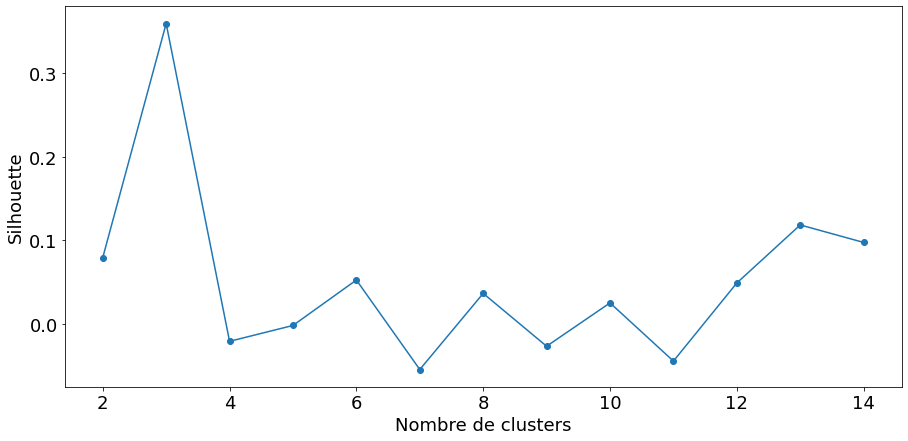

In [101]:
fig, ax = plt.subplots(figsize=(15, 7))
ax.plot(range(2,15), 
        silhouettes, 
        marker='o' 
        )
ax.set_xlabel('Nombre de clusters')
ax.set_ylabel('Silhouette')
plt.show()

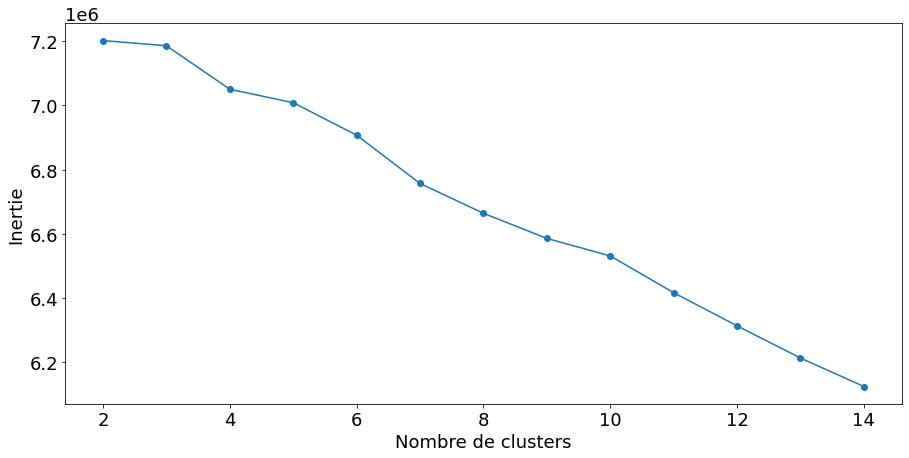

In [102]:
fig, ax = plt.subplots(figsize=(15, 7))
ax.plot(range(2,15), 
        inertie, 
        marker='o' 
        )
ax.set_xlabel('Nombre de clusters')
ax.set_ylabel('Inertie')
plt.show()

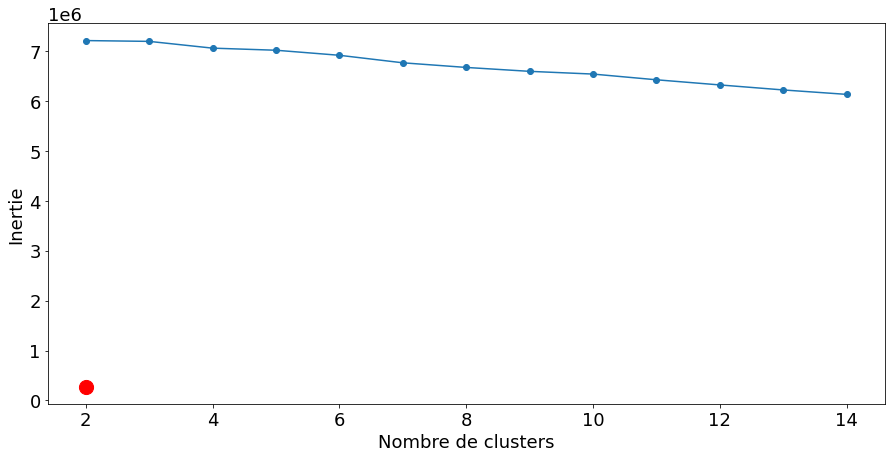

In [106]:
fig, ax = plt.subplots(figsize=(15, 7))
scaling_choice=0
xaxis = range(2,15)
kneedle = KneeLocator(xaxis, 
                      inertie, 
                      S=1.0, 
                      curve="convex", 
                      direction="decreasing"
                     ) #to determine point of highest curvature

ax.plot(xaxis, 
        inertie, 
        marker='o', 
      )

ax.scatter(kneedle.knee,
           inertia[scaling_choice][xaxis.index(kneedle.knee)],
           marker='o',s=200,color='red')

ax.set_xlabel('Nombre de clusters')
ax.set_ylabel('Inertie')
#plt.savefig('export_figures/inertie_stdscaler.png', bbox_inches='tight', dpi=150)
plt.show()

In [121]:
kmeans = cluster.KMeans(n_clusters=3, n_init=20, init='k-means++')
kmeans.fit(X_norm)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=20, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

En utilisant l'intégralité des colonnes de notre data_final, il est difficile de visualiser les clusters sur le radar. 
j'ai choisi donc de garder le rfm+ satisfaction + les top 10 catégories de produits:

In [116]:
col_clusters=['r','f','total_price','satisfaction','category_bed_bath_table','category_health_beauty',
              'category_sports_leisure','category_furniture_decor','category_computers_accessories',
              'category_housewares','category_watches_gifts','category_telephony','category_garden_tools','category_auto']

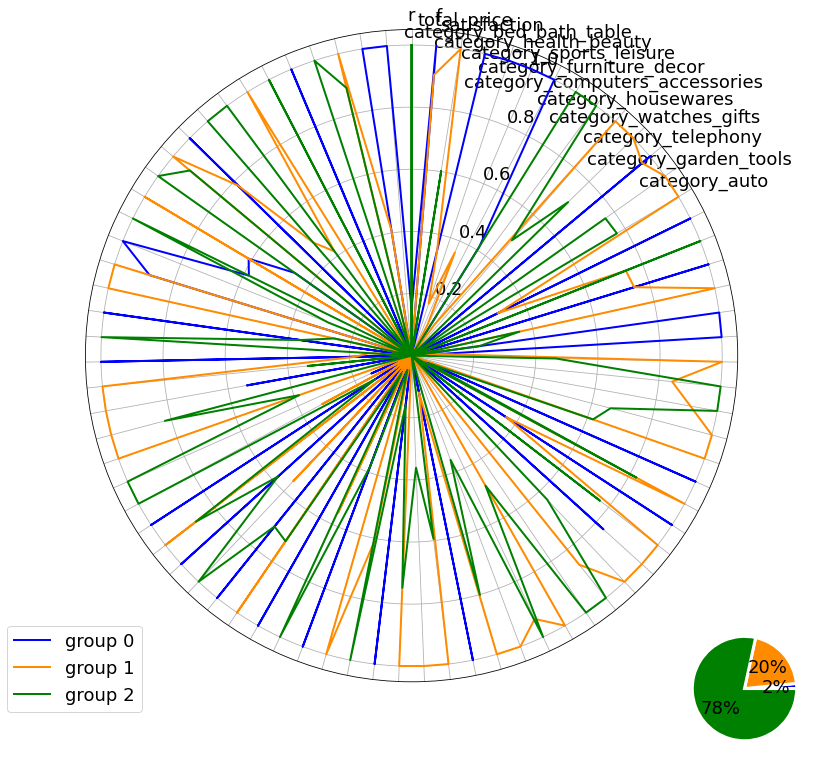

In [122]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, polar=True)
ax_inset = inset_axes(ax, width='20%', height='20%', loc=4,
                     borderpad=-4) #3: lower left corner

plot_segments(kmeans.cluster_centers_, col_clusters, colormap, ax)

#Add pie inset with clusters distribution
count_array = np.bincount(kmeans.labels_)
ax_inset.pie(count_array, labeldistance=1.15, autopct='%1.0f%%', colors=colormap,
       wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' })

plt.show()

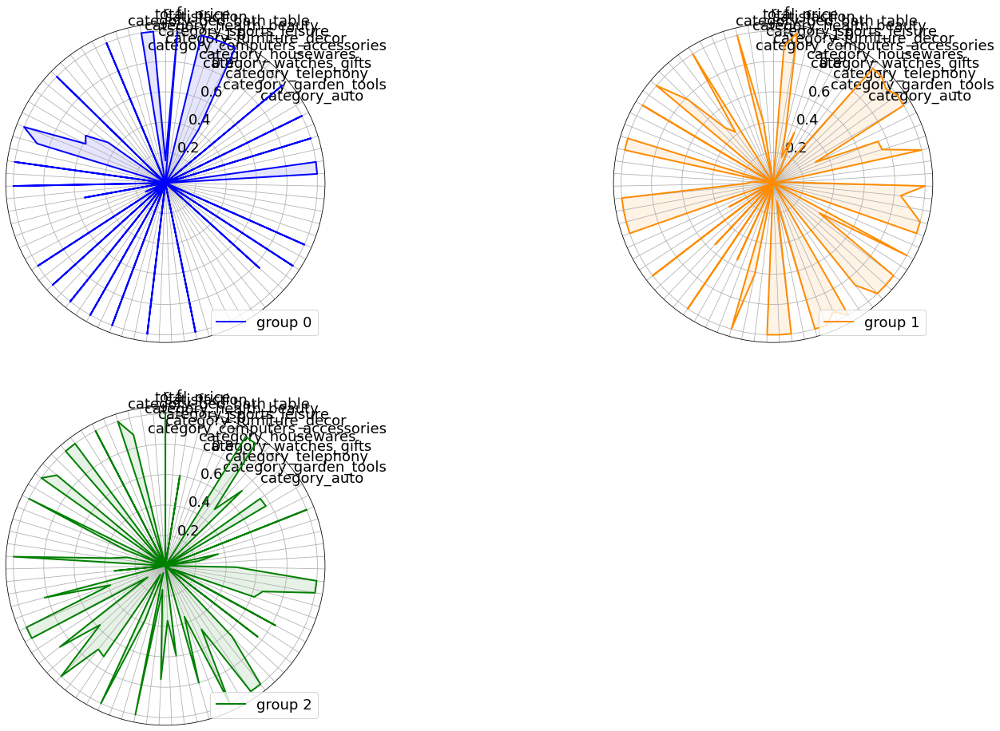

In [125]:
fig = plt.figure(figsize=(25,25))
dim = kmeans.cluster_centers_.shape[1]
angles = [n / dim * 2 * np.pi for n in range(dim)]
angles += angles[:1]
scaled_centroids = scale(kmeans.cluster_centers_, 0,1)
for i, group in enumerate(scaled_centroids):
    ax = fig.add_subplot(3, 2, i+1, polar=True)
    ax.set_ylim((0,1.05))
    #first axis on top
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(col_clusters)
    
    group = group.tolist()
    group += group[:1]
    ax.plot(angles, group, linewidth=2, linestyle='solid', color=colormap[i], label='group %d'%i)
    ax.fill(angles, group, color=colormap[i], alpha=0.1)
    
    ax.legend(loc='lower right')

plt.show()

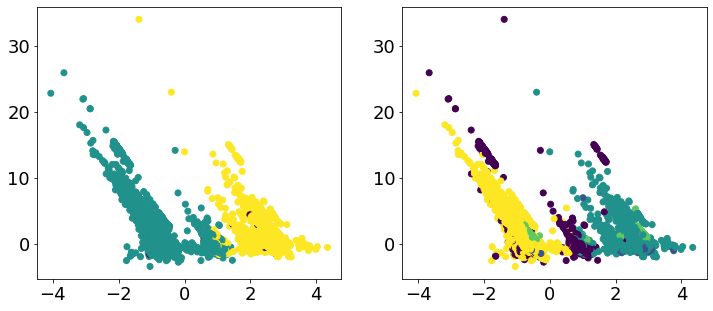

In [123]:
fig=plt.figure(figsize=(12,5))

cls=cluster.KMeans(n_clusters=3)
cls.fit(X_norm)
ax=fig.add_subplot(121)
ax.scatter(X_trans[:,0],X_trans[:,1],c=cls.labels_)

cls4=cluster.KMeans(n_clusters=5)
cls4.fit(X_norm)
ax=fig.add_subplot(122)
ax.scatter(X_trans[:,0],X_trans[:,1],c=cls4.labels_)

In [126]:
data_X = X.iloc[:,:]
data_X

,total_price,category_agro_industry_and_commerce,category_air_conditioning,category_art,category_arts_and_craftmanship,category_audio,category_auto,category_baby,category_bed_bath_table,category_books_general_interest,category_books_imported,category_books_technical,category_cds_dvds_musicals,category_christmas_supplies,category_cine_photo,category_computers,category_computers_accessories,category_consoles_games,category_construction_tools_construction,category_construction_tools_lights,category_construction_tools_safety,category_cool_stuff,category_costruction_tools_garden,category_costruction_tools_tools,category_diapers_and_hygiene,category_drinks,category_dvds_blu_ray,category_electronics,category_fashio_female_clothing,category_fashion_bags_accessories,category_fashion_childrens_clothes,category_fashion_male_clothing,category_fashion_shoes,category_fashion_sport,category_fashion_underwear_beach,category_fixed_telephony,category_flowers,category_food,category_food_drink,category_furniture_bedroom,category_furniture_decor,category_furniture_living_room,category_furniture_mattress_and_upholstery,category_garden_tools,category_health_beauty,category_home_appliances,category_home_appliances_2,category_home_comfort_2,category_home_confort,category_home_construction,category_housewares,category_industry_commerce_and_business,category_kitchen_dining_laundry_garden_furniture,category_la_cuisine,category_luggage_accessories,category_market_place,category_music,category_musical_instruments,category_office_furniture,category_party_supplies,category_perfumery,category_pet_shop,category_security_and_services,category_signaling_and_security,category_small_appliances,category_small_appliances_home_oven_and_coffee,category_sports_leisure,category_stationery,category_tablets_printing_image,category_telephony,category_toys,category_watches_gifts,category_boleto,category_credit_card,category_debit_card,category_voucher,r,f,satisfaction
0,141.90,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,159,1,1
1,27.19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,162,1,1
2,86.22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,584,1,0
3,43.62,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,370,1,1
4,196.89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,336,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93336,1148.28,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,482,1,1
93337,84.58,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,301,1,1
93338,112.46,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,617,1,1
93339,133.69,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,168,1,1


##### TSNE

In [127]:
from sklearn import manifold

In [128]:
%%time
tsne = manifold.TSNE(n_components=2, init='pca')
X_tsne = tsne.fit_transform(X_norm)

CPU times: user 1h 16min 55s, sys: 6.5 s, total: 1h 17min 2s
Wall time: 50min 53s


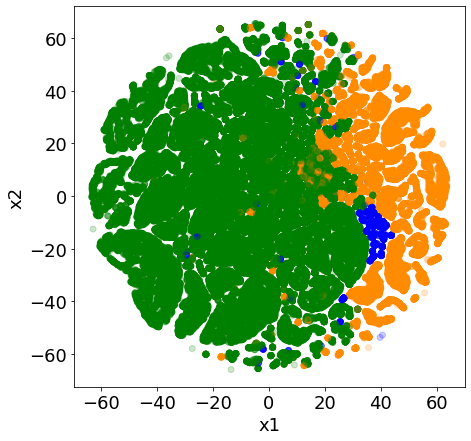

In [129]:
fig, ax = plt.subplots(figsize=(7, 7))

ax.scatter(X_tsne[:,0], X_tsne[:,1], c=colormap[kmeans.labels_], alpha=0.2)
ax.set_xlabel('x1')
ax.set_ylabel('x2')

plt.show()

### RFM Satisfaction, categorie, etat du client et vendeur

In [130]:
df_all_features=data
df_all_features.head(2)

,customer_unique_id,r,f,m,total_price,product_category_name_english,customer_state,seller_id,review_score,payment_type
0,0000366f3b9a7992bf8c76cfdf3221e2,159,1,141.90,141.90,bed_bath_table,SP,da8622b14eb17ae2831f4ac5b9dab84a,5,credit_card
1,0000b849f77a49e4a4ce2b2a4ca5be3f,162,1,27.19,27.19,health_beauty,SP,138dbe45fc62f1e244378131a6801526,4,credit_card


In [131]:
dummies = pd.get_dummies(df_all_features[['total_price','review_score','product_category_name_english','customer_state','seller_id']], prefix = 'category')
df = pd.concat([df_all_features.customer_unique_id, dummies], axis=1)
df

,customer_unique_id,total_price,review_score,category_agro_industry_and_commerce,category_air_conditioning,category_art,category_arts_and_craftmanship,category_audio,category_auto,category_baby,category_bed_bath_table,category_books_general_interest,category_books_imported,category_books_technical,category_cds_dvds_musicals,category_christmas_supplies,category_cine_photo,category_computers,category_computers_accessories,category_consoles_games,category_construction_tools_construction,category_construction_tools_lights,category_construction_tools_safety,category_cool_stuff,category_costruction_tools_garden,category_costruction_tools_tools,category_diapers_and_hygiene,category_drinks,category_dvds_blu_ray,category_electronics,category_fashio_female_clothing,category_fashion_bags_accessories,category_fashion_childrens_clothes,category_fashion_male_clothing,category_fashion_shoes,category_fashion_sport,category_fashion_underwear_beach,category_fixed_telephony,category_flowers,category_food,...,category_fcf16b7a8697e559f0123190bb30177d,category_fd312b6bf05efac6c3772d5b52205d8a,category_fd386aa7bed2af3c7035c65506c9b4a3,category_fd435faa3c0422b60440ea3480d0e77c,category_fdaaf5bfda82b7b80535610c831b8d09,category_fdb9095204a334cd8872252ffec6f2db,category_fde0cc9ea29c8ccfc0a2c22256a58c71,category_fdf736c18c589ed030e058312203e1b2,category_fe19dce63ae80346207c6c55713d1023,category_fe1b067411b8c5066e962aa146ccee03,category_fe1bbc5feda5c8979a8a1b3b2512d5a6,category_fe2032dab1a61af8794248c8196565c9,category_fe26f3ecb51a15e6d8335cd92da42562,category_fe49ee029e61e789a1f3a5525f57ba8d,category_fe4cd9461203cee790d36792420b310f,category_fe701d88b67eaca109dffd464d1be9f9,category_fe8055980a4ff7f64ed889c2b5926929,category_fe87f472055fbcf1d7e691c00b1560dc,category_fe9d9cf8631285d5982c6e2cf27fb114,category_feb793c88d836c3a75efa4b5a3465d70,category_febab0275244b9a49a623f0bd613ca2f,category_fec6275253471ace26d209bbaa64cd0f,category_fec8cd45395b3cb0c2b173d7739706a1,category_fedaedd3ca31d56ab33e92035e4b361c,category_fedf2c1386e137f296b3bbf3b635e69d,category_ff063b022a9a0aab91bad2c9088760b7,category_ff1e15b778c700abdd4d239b81ac466d,category_ff1fb4c404b2efe68b03350a8dc24122,category_ff314fa6033cc68ec451c47aee2d6ba4,category_ff4e2d38692ce827b1a4f4b8196e680d,category_ff4ea69c2a729e83e63c7579e4ef8170,category_ff69aa92bb6b1bf9b8b7a51c2ed9cf8b,category_ff82e8873fba613f2261a9acc896fd84,category_ffa6adafb71b807dc13159e26431354c,category_ffad1e7127fb622cb64a900751590acd,category_ffc470761de7d0232558ba5e786e57b7,category_ffdd9f82b9a447f6f8d4b91554cc7dd3,category_ffeee66ac5d5a62fe688b9d26f83f534,category_fffd5413c0700ac820c7069d66d98c89,category_ffff564a4f9085cd26170f4732393726
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,5,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0000f46a3911fa3c0805444483337064,86.22,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0004aac84e0df4da2b147fca70cf8255,196.89,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [ ]:
# df=df.groupby('customer_unique_id', as_index=False).max()
# df

L'utilisation de tous ces variables fait planter la saission a chaque exécution, les résultats ne s'amélioresnt pas, nous avons toujours un nombre optimum de 5 segments. nous allons donc utiliser la segmentation que nous avons eu précédement, avec le rfm+ satisfaction+ catégories des produits achetés.

### Stabilité des clusters

Dans cette partie, nous allons étudier la stabilité des clusters dans le temps pour estimer la période oprtimale pour un contrat de maintenance.

Afin d'étudier cette stabilité, nous allons utiliser nos datasets créés dans le notebook 01_analyse, ou on a un pas de 1 mois entre Octobre 2017 et Aout 2018. Nous avons choisis cette période (12 dérniers mois du dataset global dont nous disposons) parceque c'est une période ou on remarque une stabilité des commandes passées par rapport à la première années ou on a remarqué une évolution de nombre des commandes.

In [132]:
data=pd.read_csv(path_data+'df_date_2017_10.csv')
data_2017_10=data[['customer_unique_id','r','f','total_price','review_score']]
data_2017_10=data_2017_10.groupby('customer_unique_id', as_index=False).max()
data_2017_10['satisfaction'] = np.where(data_2017_10['review_score']<4, 0, 1).astype(str)
data_2017_10.head(2)

,customer_unique_id,r,f,total_price,review_score,satisfaction
0,0000f6ccb0745a6a4b88665a16c9f078,370,1,43.62,4,1
1,0012929d977a8d7280bb277c1e5f589d,364,1,155.65,1,0


In [133]:
X=data_2017_10.drop(['customer_unique_id','review_score'], axis=1).values
X_norm=preprocessing.scale(X)
X_norm.shape

(4417, 4)

In [134]:
kmeans_ref = cluster.KMeans(n_clusters=5, n_init=20, init='k-means++')
kmeans_ref.fit(X_norm)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=20, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [135]:
%%time
ref_labels_list = []
model_labels_list = []
clustering_centers = []
for year, month in [(2017,12),(2018,1),(2018,2),(2018,3),
              (2018,4),(2018,5),(2018,6),(2018,7),(2018,8)]: #décembre 2017 -> aout 2018
    data = pd.read_csv(path_data+f'df_date_{year}_{month}.csv')
    tmp=data[['customer_unique_id','r','f','total_price','review_score']]
    tmp=tmp.groupby('customer_unique_id', as_index=False).max()
    tmp['satisfaction'] = np.where(tmp['review_score']<4, 0, 1).astype(str)
    X_new = tmp.drop(['customer_unique_id','review_score'], axis=1).values
    ###Attention, ici on rescale le nouveau dataset avec le scaler entraîné sur les données initiales
    # donc transform() et pas fit_transform()
    X_new_scaled = preprocessing.scale(X_new)
    ref_labels = kmeans_ref.predict(X_new_scaled)
    
    kmeans = cluster.KMeans(n_clusters=5, n_init=20, init='k-means++')
    kmeans.fit(X_new_scaled)
    
    ref_labels_list.append(ref_labels)
    model_labels_list.append(kmeans.labels_)
    
    clustering_centers.append(kmeans.cluster_centers_)

CPU times: user 3.85 s, sys: 3.52 s, total: 7.36 s
Wall time: 5.76 s


In [138]:
col=['r','f','total_price','satisfaction']
names = ['décembre_17', 'janvier_18', 'février_18', 
             'mars_18', 'avril_18', 'mai_18', 'juin_18', 
             'juillet_18', 'aout_18']

In [146]:
#Décembre 2017
df_1 = pd.DataFrame(clustering_centers[0], columns=col)
df_1['N_clients'] = np.bincount(model_labels_list[0])
get_clusters_name(df_1)
df_1

,r,f,total_price,satisfaction,N_clients,Cluster
4,-0.344219,3.554328,0.071438,0.282342,185,A
0,0.107660,-0.186272,-0.150312,0.540729,3902,B
2,-0.112200,-0.025558,4.398307,-0.349694,153,C
3,-7.697216,4.874464,0.178042,0.338180,59,D
1,0.099819,-0.186272,-0.095694,-1.849355,1151,E


In [147]:
df_1_ref = pd.DataFrame(kmeans_ref.cluster_centers_, columns=col)
df_1_ref['N_clients_ref'] = np.bincount(ref_labels_list[0])
get_clusters_name(df_1_ref)
df_1_ref

,r,f,total_price,satisfaction,N_clients_ref,Cluster
0,-0.242249,2.591159,-0.060022,0.310896,176,A
3,0.141771,-0.182804,-0.154673,0.487088,3891,B
4,0.139152,-0.165412,4.216618,0.104333,164,C
2,-6.941856,4.209205,0.132169,0.418437,68,D
1,0.098371,-0.182804,-0.145571,-2.053016,1151,E


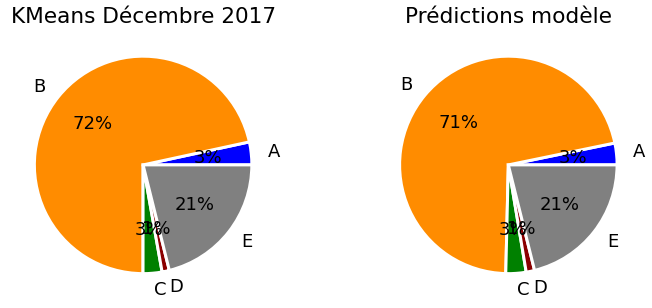

In [148]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(12,5))

df_1['N_clients'].plot.pie(ylabel='',
                           labels=df_1['Cluster'],
                           labeldistance=1.15, 
                           autopct='%1.0f%%', 
                           colors=colormap,
                           wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' },
                           ax=ax1)
ax1.set_title('KMeans Décembre 2017')

df_1_ref['N_clients_ref'].plot.pie(ylabel='',
                                   labels=df_1_ref['Cluster'],
                                   labeldistance=1.15, 
                                   autopct='%1.0f%%', 
                                   colors=colormap,
                                   wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' },
                                   ax=ax2)
ax2.set_title('Prédictions modèle')

plt.show()

In [149]:
#janvier 2018:
df_2 = pd.DataFrame(clustering_centers[1], columns=col)
df_2['N_clients'] = np.bincount(model_labels_list[1])
get_clusters_name(df_2)
df_2

,r,f,total_price,satisfaction,N_clients,Cluster
4,-0.419249,3.273596,0.095495,0.304653,251,A
0,0.131650,-0.189743,-0.141929,0.542326,4945,B
2,0.109567,-0.105016,4.520737,-0.098190,190,C
3,-7.270669,5.022979,0.170378,0.400288,84,D
1,0.029349,-0.189743,-0.129908,-1.843909,1504,E


In [150]:
for i, (centers, labels) in enumerate(zip(clustering_centers,model_labels_list)):
    df = pd.DataFrame(centers, columns=col)
    df[names[i]] = np.bincount(labels)
    get_clusters_name(df)
    df = df[[names[i]]]
    if i==0:
        df_out = df.copy()
    else:
        df_out = pd.concat([df_out,df],axis=1)

df_out

,décembre_17,janvier_18,février_18,mars_18,avril_18,mai_18,juin_18,juillet_18,aout_18
0,3902,4945,4150,4393,2545,158,2619,2867,2506
1,1151,1504,1710,1960,1253,3411,970,1910,1012
2,153,190,83,60,152,1214,2076,965,112
3,59,84,196,242,290,291,250,238,2480
4,185,251,262,259,2504,1619,143,117,200


In [151]:
for i, labels in enumerate(ref_labels_list):
    df = pd.DataFrame(kmeans_ref.cluster_centers_, columns=col)
    df[names[i]] = np.bincount(labels)
    get_clusters_name(df)
    # df = df.set_index('Cluster')
    df = df[[names[i]]]
    if i==0:
        df_out_ref = df.copy()
    else:
        df_out_ref = pd.concat([df_out_ref,df],axis=1)
df_out_ref

,décembre_17,janvier_18,février_18,mars_18,avril_18,mai_18,juin_18,juillet_18,aout_18
0,176,244,262,238,234,247,218,232,198
3,3891,4935,4148,4413,5004,4988,4676,4750,4934
4,164,202,197,230,200,200,166,147,166
2,68,90,83,64,56,45,32,6,2
1,1151,1503,1711,1969,1250,1213,966,962,1010


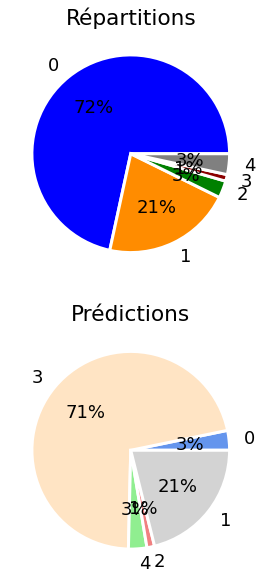

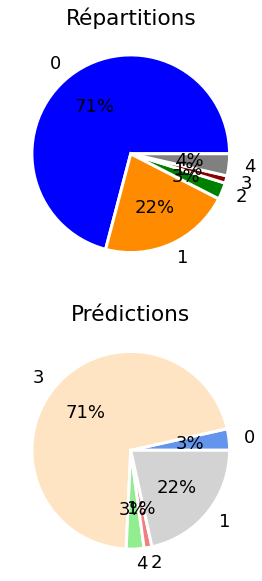

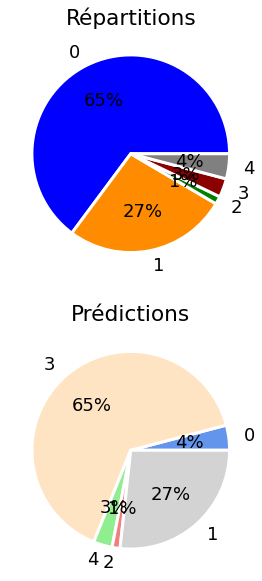

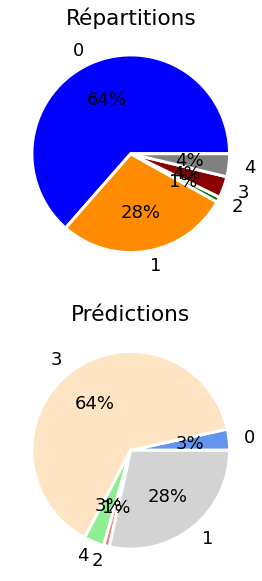

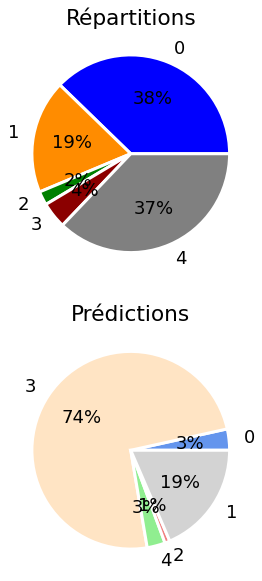

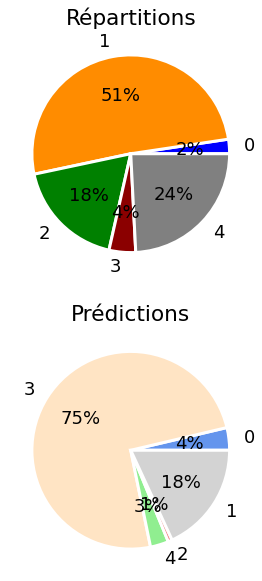

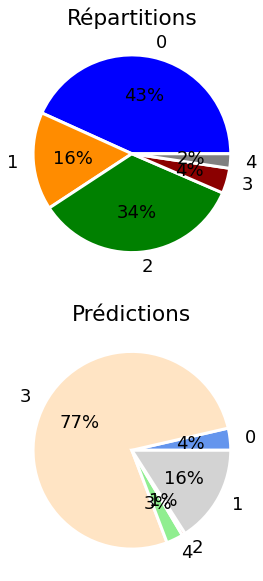

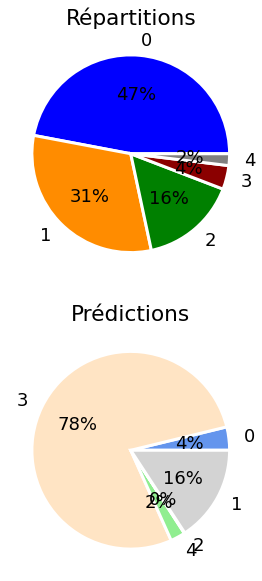

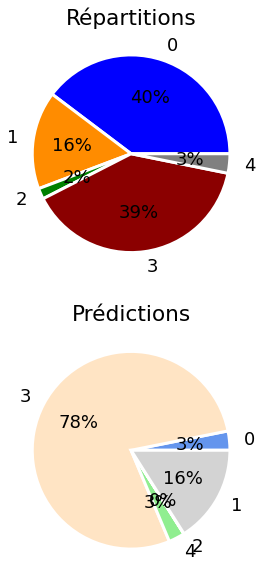

In [152]:
colormap_ref = np.array(['cornflowerblue','bisque','lightgreen','lightcoral','lightgray','plum'])
for i in range(df_out.shape[1]):
    fig, (ax1,ax2) = plt.subplots(2,1,figsize=(5,10))

    df_out.iloc[:,i].plot.pie(ylabel='',
                               labels=df_out.index,
                               labeldistance=1.15, 
                               autopct='%1.0f%%', 
                               colors=colormap,
                               wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' },
                               ax=ax1)
    ax1.set_title('Répartitions')

    df_out_ref.iloc[:,i].plot.pie(ylabel='',
                                       labels=df_out_ref.index,
                                       labeldistance=1.15, 
                                       autopct='%1.0f%%', 
                                       colors=colormap_ref, #no alpha argument for pie
                                       wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' },
                                       ax=ax2)
    ax2.set_title('Prédictions')
    
    plt.show()

On voit que pour les premiers mois, nous avons une meme distribution entre la prédiction et la répartition réélle, alors que pour les derniers mois la différence est très grande

In [153]:
#from Generators.integers, recommended method for new code (Numpy documentation)
rng = np.random.default_rng() 

ARIs = [1] #Adjusted Rand Index encounters overflow errors when using more than ~60000 values
for i, (ref_labels, labels) in enumerate(zip(ref_labels_list, model_labels_list)): 
    #create a random sample of 50000 integers (or number of points is if smaller) between 0 and len(labels)
    indices = rng.integers(0,len(ref_labels), size=min(50000,len(ref_labels)))
    ARIs.append(metrics.adjusted_rand_score(ref_labels[indices], labels[indices]))

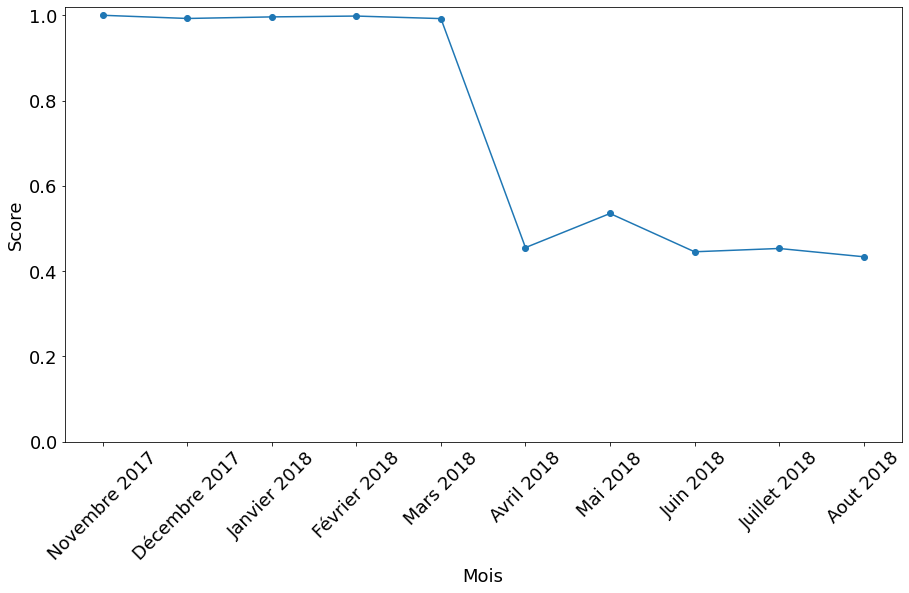

In [154]:
fig, ax = plt.subplots(figsize=(15,8))
x_axis= range(len(ARIs))
ax.plot(x_axis, ARIs, marker='o')
ax.set_xticks(x_axis)
ax.set_xticklabels(['Novembre 2017', 'Décembre 2017',
                    'Janvier 2018', 'Février 2018', 'Mars 2018', 
                    'Avril 2018', 'Mai 2018', 'Juin 2018', 
                    'Juillet 2018', 'Aout 2018'], rotation = 45)
ax.set_xlabel('Mois')
ax.set_ylabel('Score')
ax.set_ylim(0.0, 1.02)

plt.show()